In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import time

gpus = tf.config.list_physical_devices("GPU")
print(gpus)
device = gpus[0]
# tf.config.set_visible_devices(device)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
# data type
data_type = tf.float64
tf.keras.backend.set_floatx('float64')

In [3]:
# constants
U = 4.043564066
rho = 1.23
h = 300.0

# load meteo data
df_meteo = pd.read_csv("../../cylinder/meteo.csv")

# load CFD data position
file_path = "../../cylinder_cell_data/"
df = pd.read_csv(file_path + f"CFD_cell_data_simulation_central_region_subsampled_1.csv")
x_train = tf.cast(tf.reshape((df.to_numpy()[:, 0] - 500.0) / 300.0, [-1, 1]), dtype=data_type)
y_train = tf.cast(tf.reshape((df.to_numpy()[:, 1] - 500.0) / 300.0, [-1, 1]), dtype=data_type)
z_train = tf.cast(tf.reshape(df.to_numpy()[:, 2] / 300.0, [-1, 1]), dtype=data_type)

train_data_list = []
PDE_train_angle = np.arange(270, 90-15, -15)
for wind_angle in PDE_train_angle:
    wind_angle = np.deg2rad(wind_angle)
    theta_train = tf.ones_like(x_train, dtype=data_type) * wind_angle
    train_data = tf.concat([x_train, y_train, z_train, theta_train], axis=1)
    train_data_list.append(train_data)
    
train_data_list = tf.concat(train_data_list, axis=0)
print("unsupervised part training data:")
print(train_data_list)

train_dataset_PDE = tf.data.Dataset.from_tensor_slices(train_data_list)
train_dataset_PDE = train_dataset_PDE.shuffle(100000).batch(6500)


# simulation data
file_path = "../../cylinder_cell_data/"

train_data = []
train_label = []
for i in range(1, 8):
    df = pd.read_csv(file_path + f"CFD_cell_data_simulation_central_region_subsampled_{i}.csv")
    
    # train data
    pos = df.to_numpy()[:, 0:3]
    
    # scaling
    # x, y to [-1, 1]
    # z to [0, 1]
    pos[:, 0] = (pos[:, 0] - 500.0) / 300.0
    pos[:, 1] = (pos[:, 1] - 500.0) / 300.0
    pos[:, 2] = pos[:, 2] / 300.0
    
    theta = df_meteo["Orientation"][i-1]
    theta = np.ones((pos.shape[0], 1)) * theta
    pos = np.hstack((pos, theta))
    
    # train label
    ux = df.to_numpy()[:, 5]
    uy = df.to_numpy()[:, 6]
    uz = df.to_numpy()[:, 7]
    p = df.to_numpy()[:, 3]
    nut = df.to_numpy()[:, 4]

    # scaling
    ux = ux / U
    uy = uy / U
    uz = uz / U
    p = p / (rho * U**2)
    nut = nut / (U * h)
    
    flow_attributes = np.vstack((ux, uy, uz, p, nut)).T
    
    train_data.append(pos)
    train_label.append(flow_attributes)
    
train_data = tf.concat(train_data, axis=0)
train_label = tf.concat(train_label, axis=0)


print("supervised part training data and label:")
print(train_data, train_label)

train_dataset_CFD = tf.data.Dataset.from_tensor_slices((train_data, train_label))
train_dataset_CFD = train_dataset_CFD.shuffle(50000).batch(3500)


unsupervised part training data:
tf.Tensor(
[[ 0.17863937  0.00520531  0.08180876  4.71238898]
 [ 0.37757797 -0.98774061  0.18785621  4.71238898]
 [-0.02503228 -0.01668356  0.15280822  4.71238898]
 ...
 [-0.32972262  0.11543096  0.2352984   1.57079633]
 [-0.17639417 -0.11113599  0.16801507  1.57079633]
 [ 0.02148821  0.24812914  0.18495784  1.57079633]], shape=(650000, 4), dtype=float64)
supervised part training data and label:
tf.Tensor(
[[ 0.17863937  0.00520531  0.08180876  4.71238898]
 [ 0.37757797 -0.98774061  0.18785621  4.71238898]
 [-0.02503228 -0.01668356  0.15280822  4.71238898]
 ...
 [-0.32972262  0.11543096  0.2352984   1.57079633]
 [-0.17639417 -0.11113599  0.16801507  1.57079633]
 [ 0.02148821  0.24812914  0.18495784  1.57079633]], shape=(350000, 4), dtype=float64) tf.Tensor(
[[ 1.07747416e-02 -6.73819781e-01  4.44673814e-03 -1.43619828e-01
   2.05460650e-03]
 [ 7.65614811e-03 -8.63262939e-01 -5.12961456e-04 -1.41152550e-01
   4.55528266e-03]
 [ 2.98214663e-02 -4.01148750

In [4]:
# define composite model
NN_mask = tf.keras.models.load_model("../../model_mask/model_11")

# load pretrained NN for ux, uy, uz, p, nut
NN_ux = tf.keras.models.load_model("../models/composite_model_simpler_cell_data_w50_hl10_tanh_ux")
NN_uy = tf.keras.models.load_model("../models/composite_model_simpler_cell_data_w50_hl10_tanh_uy")
NN_uz = tf.keras.models.load_model("../models/composite_model_simpler_cell_data_w50_hl10_tanh_uz")
NN_p = tf.keras.models.load_model("../models/p_pure_nn_w50_hl10_tanh")
NN_nut = tf.keras.models.load_model("../models/nut_pure_nn_w50_hl10_tanh")

# def get_NN():
#     width = 50
#     num_hl = 10
#     activation_type = "tanh"
#     inputs = tf.keras.Input(shape=(4,))
#     for i in range(num_hl):
#         if i == 0:
#             x = tf.keras.layers.Dense(width, activation=activation_type, use_bias=True)(inputs)
#         x = tf.keras.layers.Dense(width, activation=activation_type, use_bias=True)(x)
        
#     outputs = tf.keras.layers.Dense(1, activation="linear", use_bias=True)(x)
#     model = tf.keras.Model(inputs=inputs, outputs=outputs)
#     return model
# NN_ux = get_NN()
# NN_uy = get_NN()
# NN_uz = get_NN()
# NN_p = get_NN()
# NN_nut = get_NN()


h = tf.constant(300.0, dtype=data_type)
U = 4.043564066
z_ref = df_meteo["Height"][0] / h

def input_convert(theta, x, y, z):
    x_ = tf.cast(tf.reshape(x, [-1,1]), dtype=data_type)
    y_ = tf.cast(tf.reshape(y, [-1,1]), dtype=data_type)
    z_ = tf.cast(tf.reshape(z, [-1,1]), dtype=data_type)
    theta_ = tf.cast(tf.reshape(theta, [-1,1]), dtype=data_type)
    
    return theta_, x_, y_, z_


def velocity_mean_x(varphi, x, y, z): 
    """
    mean flow to ensure boundary conditions
    """
    varphi_, x_, y_, z_ = input_convert(varphi, x, y, z)
    z_ref = 100.0 / h  # make it variables
    log_profile = tf.math.log(z_ + 1) / tf.math.log(z_ref + 1)
    U_x = tf.math.cos(varphi_) * log_profile

    return U_x


def velocity_mean_y(varphi, x, y, z):
    """
    mean flow to ensure boundary conditions
    """
    varphi_, x_, y_, z_ = input_convert(varphi, x, y, z)
    z_ref = 100.0 / h  # make it variables
    log_profile = tf.math.log(z_ + 1) / tf.math.log(z_ref + 1)
    U_y = tf.math.sin(varphi_) * log_profile

    return U_y


def velocity_mean_z(varphi, x, y, z): 
    """
    mean flow to ensure boundary conditions
    """
    varphi_, x_, y_, z_ = input_convert(varphi, x, y, z)
    U_z = 0 * z_

    return U_z


def ux_model(data):
    # data: N by 4
    # [x, y, z, theta]
    
    U_x = velocity_mean_x(data[:, 3], data[:, 0], data[:, 1], data[:, 2])
#     print(U_x.shape)
    
    g_z = tf.reshape(tf.math.sin(np.pi * data[:, 2]), [-1, 1])
#     print(g_z.shape)
    
    ux = NN_mask(data[:, 0:3]) * (U_x + g_z * NN_ux(data))
    
    return ux

def uy_model(data):
    # data: N by 4
    # [x, y, z, theta]
    
    U_y = velocity_mean_y(data[:, 3], data[:, 0], data[:, 1], data[:, 2])
#     print(U_y.shape)
    
    g_z = tf.reshape(tf.math.sin(np.pi * data[:, 2]), [-1, 1])
#     print(g_z.shape)
    
    uy = NN_mask(data[:, 0:3]) * (U_y + g_z * NN_uy(data))
    
    return uy

def uz_model(data):
    # data: N by 4
    # [x, y, z, theta]
    
    U_z = velocity_mean_z(data[:, 3], data[:, 0], data[:, 1], data[:, 2])
#     print(U_z.shape)
    
    g_z = tf.reshape(tf.math.sin(np.pi * data[:, 2]), [-1, 1])
#     print(g_z.shape)
    
    uz = NN_mask(data[:, 0:3]) * (U_z + g_z * NN_uz(data))
    
    return uz

In [5]:
def compute_PDE_residues(x_test, y_test, z_test, theta_test):
    # compute the RANS residue for multiple points at one wind angle
    with tf.GradientTape(persistent=True) as tape1:
        tape1.watch(x_test)
        tape1.watch(y_test)
        tape1.watch(z_test)
        with tf.GradientTape(persistent=True) as tape:
            tape.watch(x_test)
            tape.watch(y_test)
            tape.watch(z_test)
            
            # for NN inputs
            points_test = tf.concat([x_test, y_test, z_test, theta_test], axis=1)
            
            # forward pass
            ux = ux_model(points_test)
            uy = uy_model(points_test)
            uz = uz_model(points_test)
            p = NN_p(points_test)
            nut = NN_nut(points_test)
            
        dux_dx = tape.gradient(ux, x_test)
        dux_dy = tape.gradient(ux, y_test)
        dux_dz = tape.gradient(ux, z_test)
        
        duy_dx = tape.gradient(uy, x_test)
        duy_dy = tape.gradient(uy, y_test)
        duy_dz = tape.gradient(uy, z_test)
        
        duz_dx = tape.gradient(uz, x_test)
        duz_dy = tape.gradient(uz, y_test)
        duz_dz = tape.gradient(uz, z_test)
        
        dp_dx = tape.gradient(p, x_test)
        dp_dy = tape.gradient(p, y_test)
        dp_dz = tape.gradient(p, z_test)
        
        dnut_dx = tape.gradient(nut, x_test)
        dnut_dy = tape.gradient(nut, y_test)
        dnut_dz = tape.gradient(nut, z_test)
    
    d2ux_dx2 = tape1.gradient(dux_dx, x_test)
    d2ux_dy2 = tape1.gradient(dux_dy, y_test)
    d2ux_dz2 = tape1.gradient(dux_dz, z_test)
    
    d2uy_dx2 = tape1.gradient(duy_dx, x_test)
    d2uy_dy2 = tape1.gradient(duy_dy, y_test)
    d2uy_dz2 = tape1.gradient(duy_dz, z_test)
    
    d2uz_dx2 = tape1.gradient(duz_dx, x_test)
    d2uz_dy2 = tape1.gradient(duz_dy, y_test)
    d2uz_dz2 = tape1.gradient(duz_dz, z_test)
        
    # term 1
    term_1_x = dux_dx * ux + dux_dy * uy + dux_dz * uz
    term_1_y = duy_dx * ux + duy_dy * uy + duy_dz * uz
    term_1_z = duz_dx * ux + duz_dy * uy + duz_dz * uz
    
    # term 2
    term_2_x = -dp_dx
    term_2_y = -dp_dy
    term_2_z = -dp_dz
    
    # term 3
    term_3_x = nut * (d2ux_dx2 + d2ux_dy2 + d2ux_dz2)
    term_3_y = nut * (d2uy_dx2 + d2uy_dy2 + d2uy_dz2)
    term_3_z = nut * (d2uz_dx2 + d2uz_dy2 + d2uz_dz2)

    # term 4
    term_4_x = dnut_dx * (dux_dx + dux_dx) + dnut_dy * (dux_dy + duy_dx) + dnut_dz * (dux_dz + duz_dx)
    term_4_y = dnut_dx * (duy_dx + dux_dy) + dnut_dy * (duy_dy + duy_dy) + dnut_dz * (duy_dz + duz_dy)
    term_4_z = dnut_dx * (duz_dx + dux_dz) + dnut_dy * (duz_dy + duy_dz) + dnut_dz * (duz_dz + duz_dz)
    
    # RANS
    loss_rans_x = term_1_x - term_2_x - term_3_x - term_4_x
    loss_rans_y = term_1_y - term_2_y - term_3_y - term_4_y
    loss_rans_z = term_1_z - term_2_z - term_3_z - term_4_z
    loss_rans = tf.math.sqrt(tf.square(loss_rans_x) + tf.square(loss_rans_y) + tf.square(loss_rans_z))
    
    # div
    div = dux_dx + duy_dy + duz_dz
    loss_div = div
    
    
    del tape
    del tape1
    
    return loss_rans, loss_div

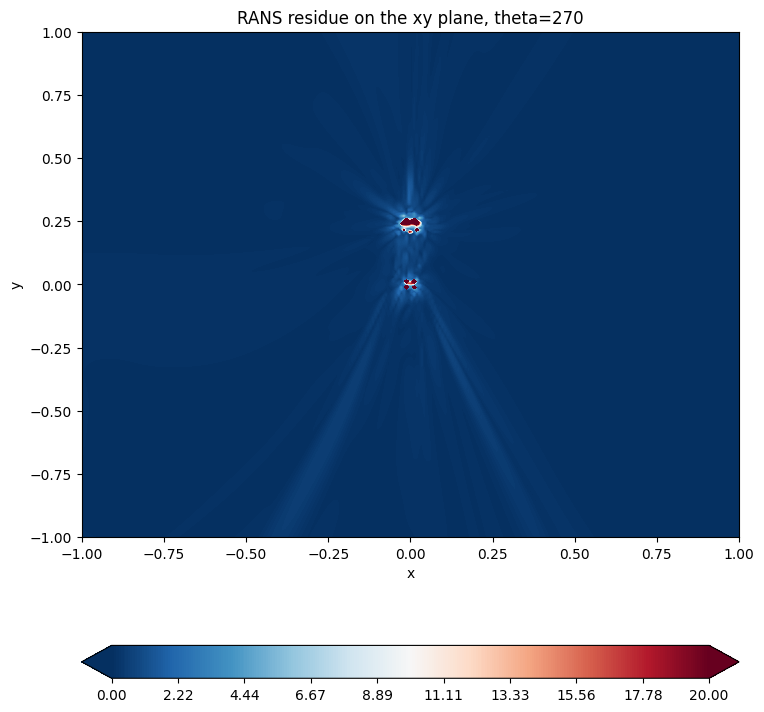

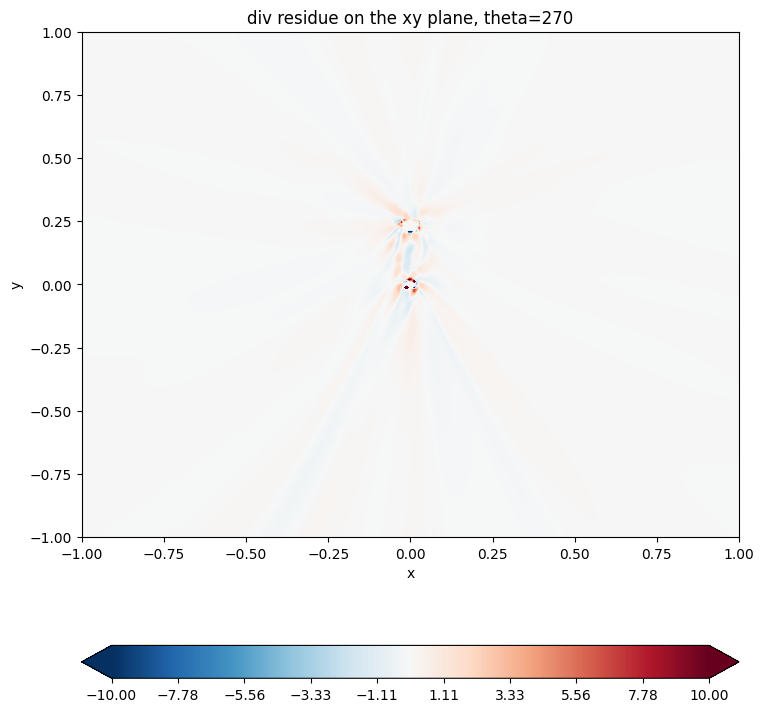

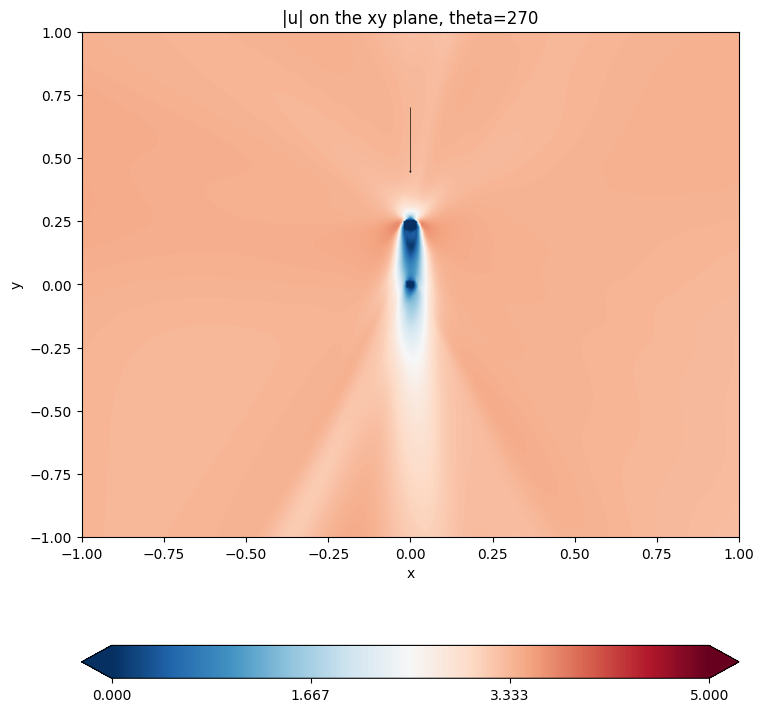

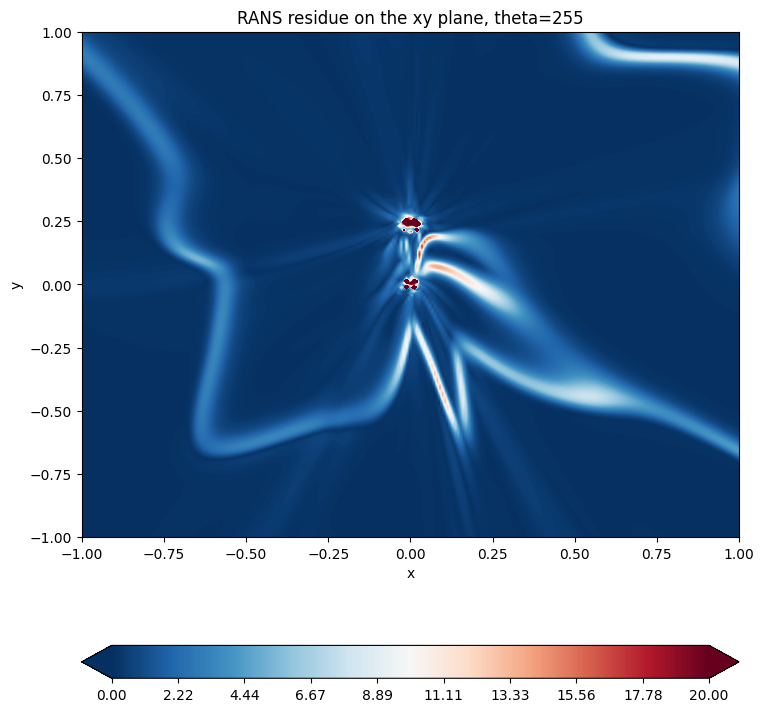

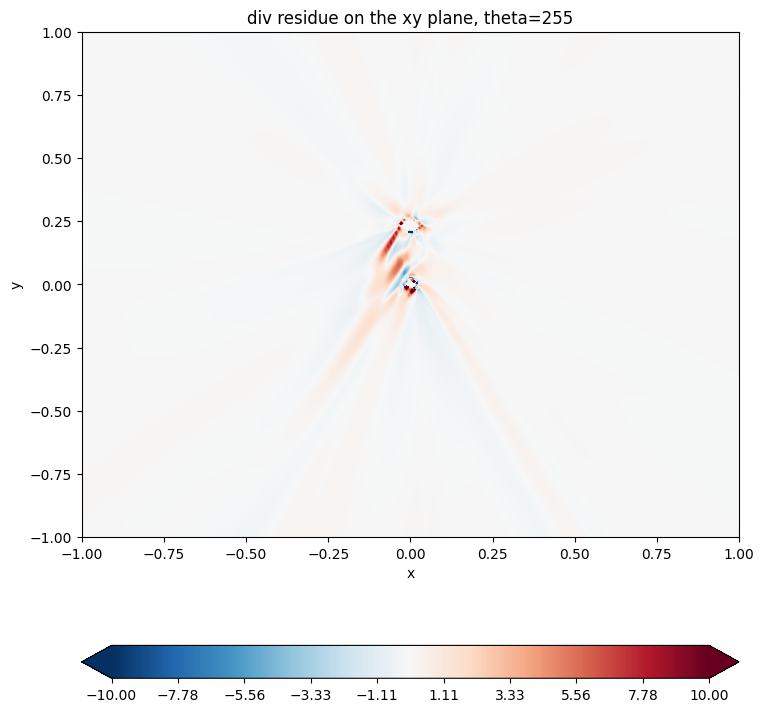

...

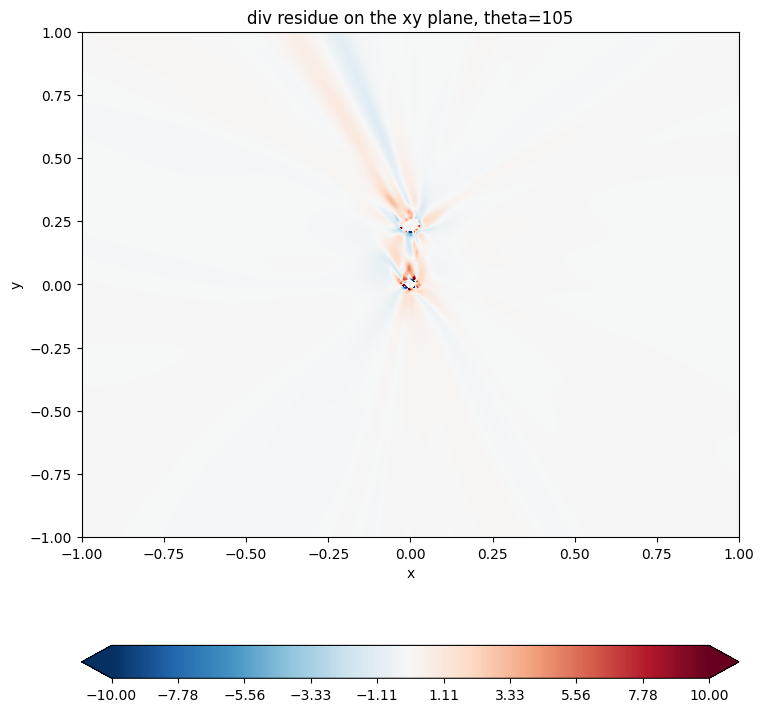

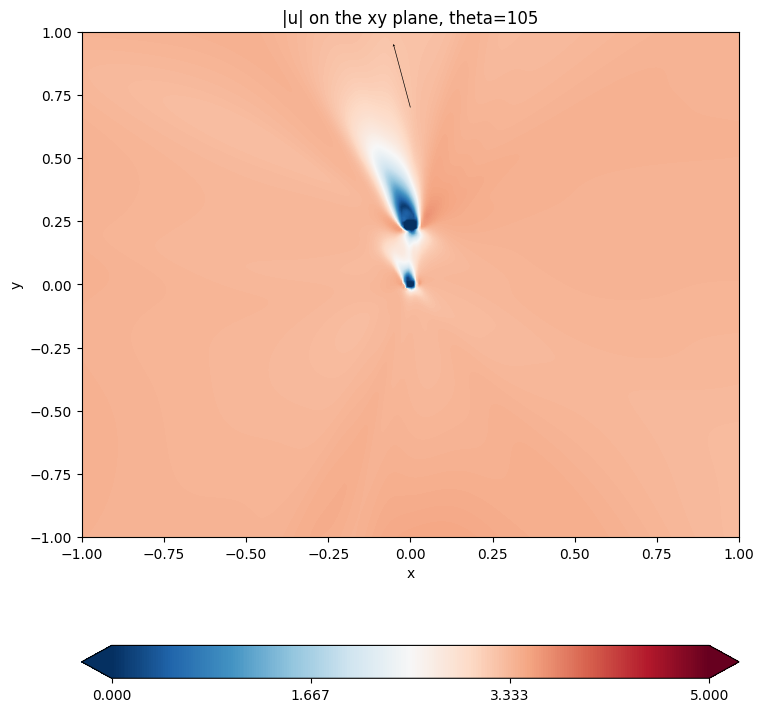

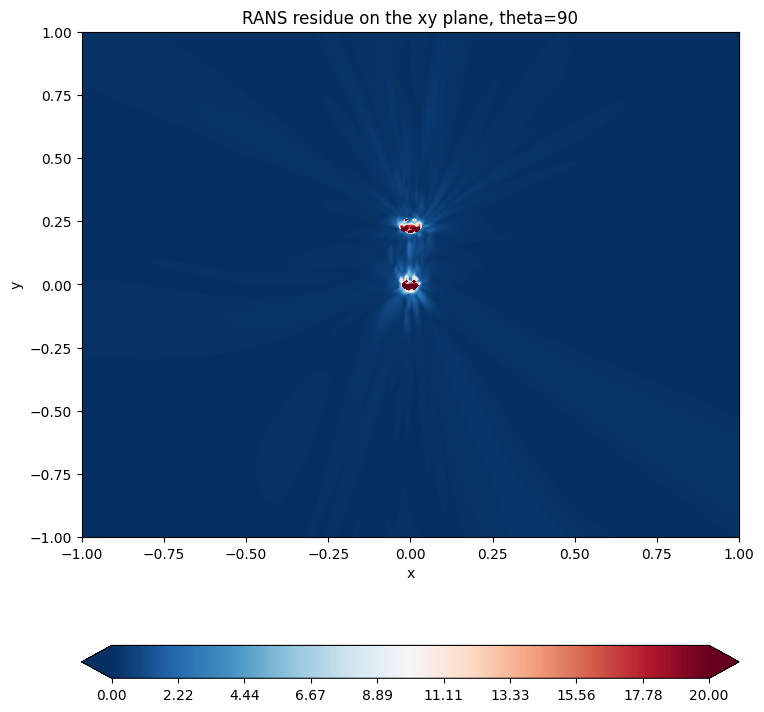

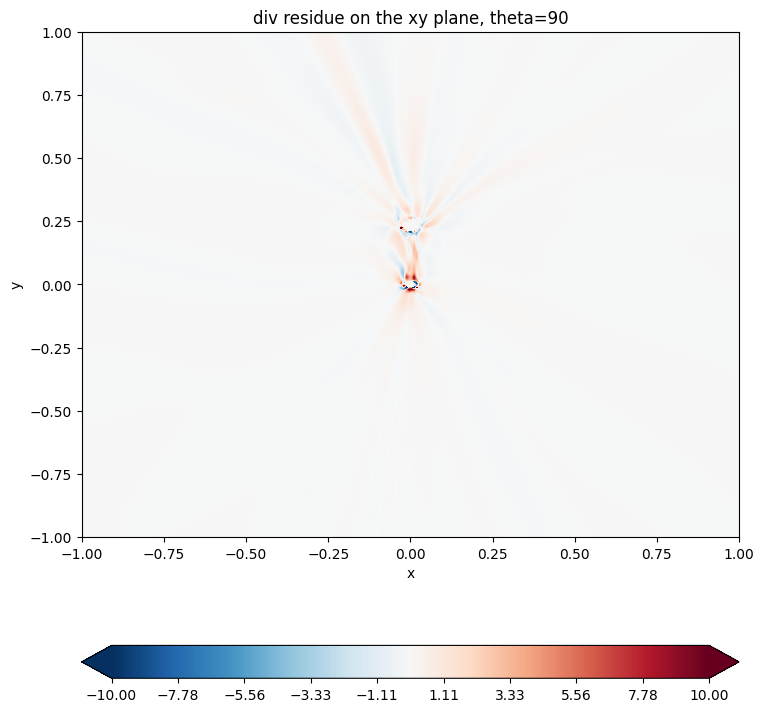

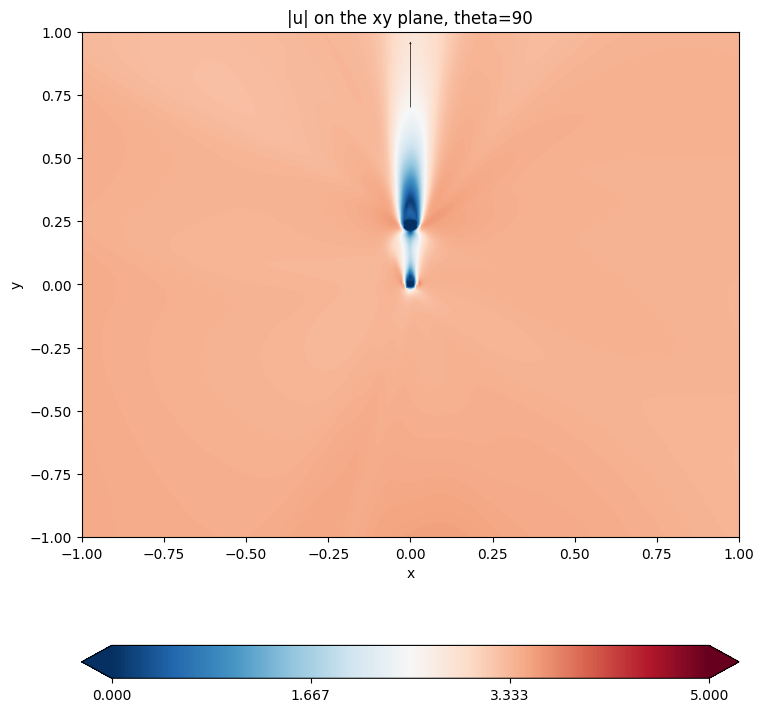

In [6]:
# check before training

# sample on uniform grid and plot the results
# test on xy plane
resolution = 256
test_height = 50  # unit: meter

theta_range = np.arange(270, 90-15, -15)

for theta in theta_range:
    test_theta = np.deg2rad(theta)
    
    x = np.linspace(-1, 1, resolution)
    y = np.linspace(-1, 1, resolution)
    x_grid, y_grid = np.meshgrid(x, y)
    x_test = np.reshape(x_grid, (-1, 1))
    y_test = np.reshape(y_grid, (-1, 1))
    z_test = np.ones_like(x_test) * test_height / 300.0
    theta_test = np.ones_like(x_test) * test_theta
    
    x_test = tf.cast(x_test, dtype=data_type)
    y_test = tf.cast(y_test, dtype=data_type)
    z_test = tf.cast(z_test, dtype=data_type)
    theta_test = tf.cast(theta_test, dtype=data_type)
    
    loss_rans, loss_div = compute_PDE_residues(x_test, y_test, z_test, theta_test)
    
    loss_rans = tf.reshape(loss_rans, x_grid.shape)
    loss_div = tf.reshape(loss_div, x_grid.shape)
    
    # plot xy slice for rans
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, y_grid, loss_rans, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,20,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,20,10, endpoint=True))
    plt.xlabel("x")
    plt.ylabel("y")
    ax.set_title(f'RANS residue on the xy plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xy slice for div
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, y_grid, loss_div, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(-10,10,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(-10,10,10, endpoint=True))
    plt.xlabel("x")
    plt.ylabel("y")
    ax.set_title(f'div residue on the xy plane, theta={theta}')
    # plt.gca().invert_xaxis()
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xy slice for u norm
    test_data = tf.concat([x_test, y_test, z_test, theta_test], axis=1)
    test_data = tf.cast(test_data, dtype=data_type)
    ux_pred = ux_model(test_data) * U
    uy_pred = uy_model(test_data) * U
    uz_pred = uz_model(test_data) * U
    u_norm = np.linalg.norm(tf.concat([ux_pred, uy_pred, uz_pred], axis=1), axis=1)
    u_norm = tf.reshape(u_norm, x_grid.shape)
    
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, y_grid, u_norm, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,5,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,5,4, endpoint=True))
    
    # plot wind direction
    wind_dir = np.array([np.cos(test_theta), np.sin(test_theta)])
    ax.quiver(0, 0.7, wind_dir[0], wind_dir[1], color="k", scale=10, width=0.001, headwidth=4, headlength=4, headaxislength=3)
    
    plt.xlabel("x")
    plt.ylabel("y")
    ax.set_title(f'|u| on the xy plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    

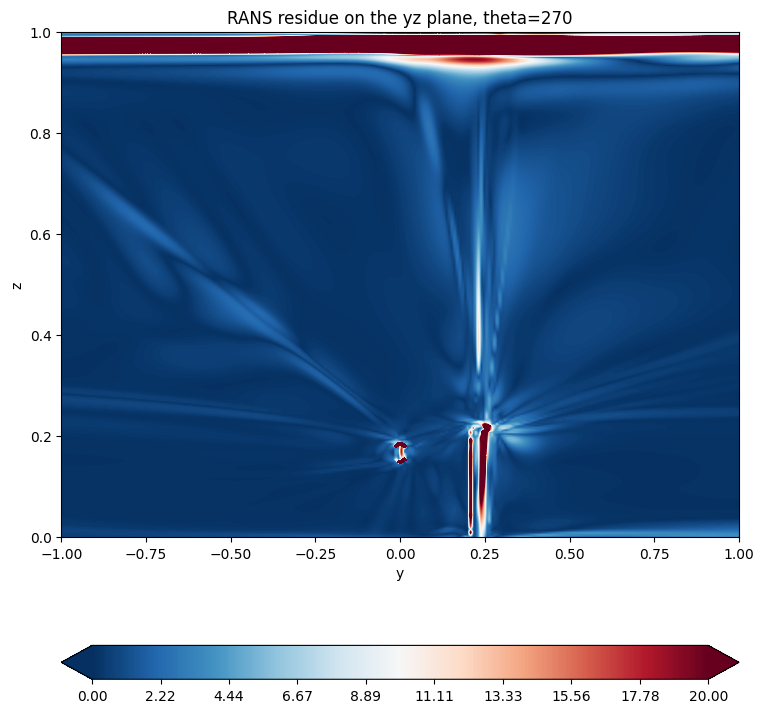

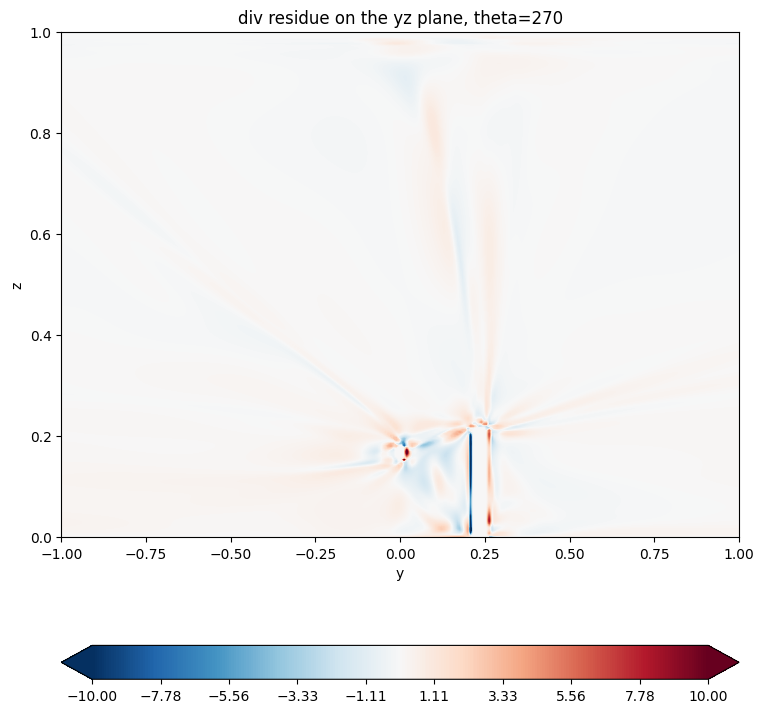

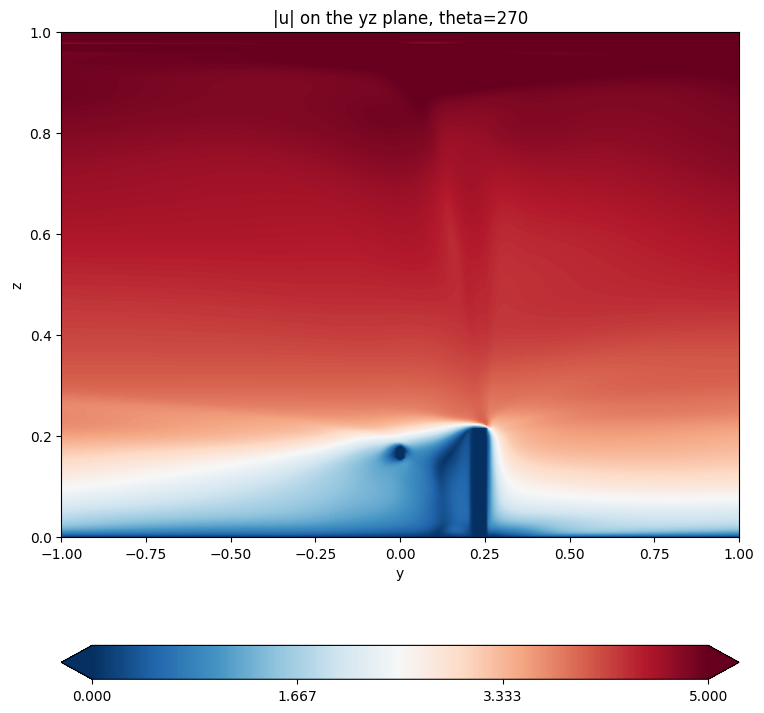

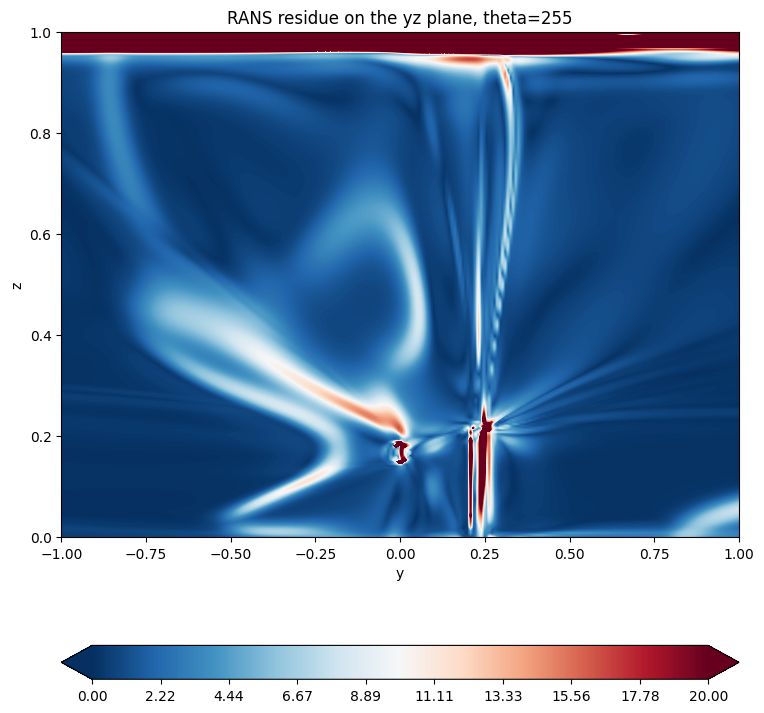

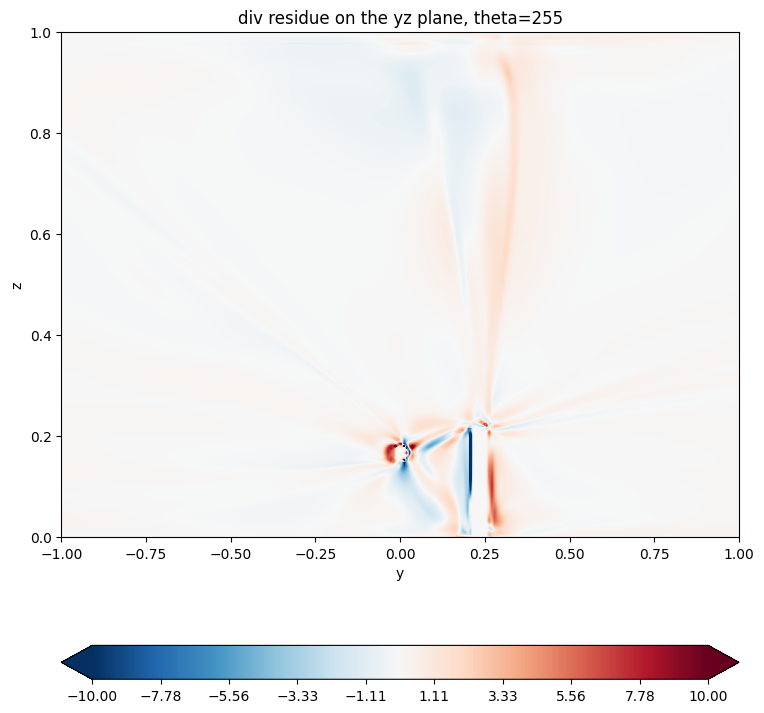

...

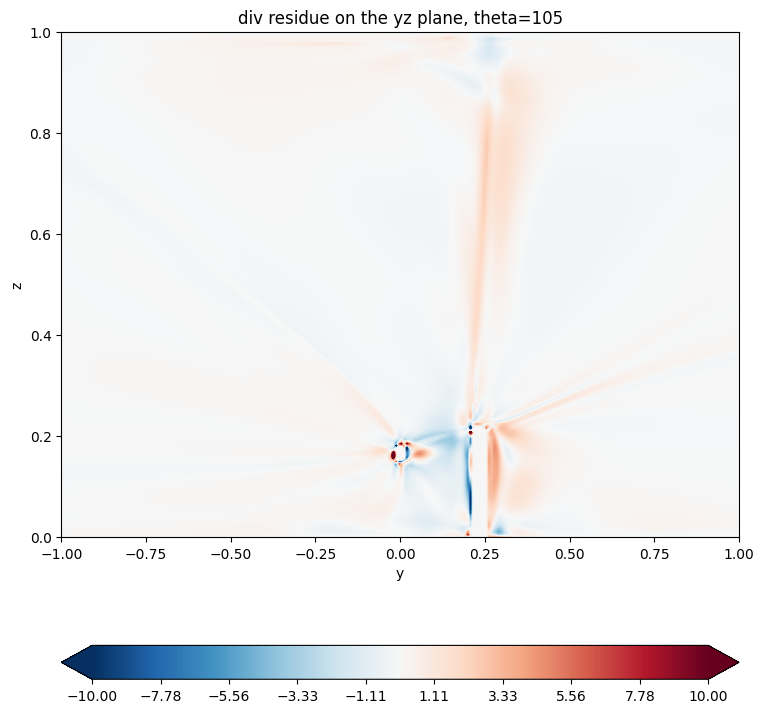

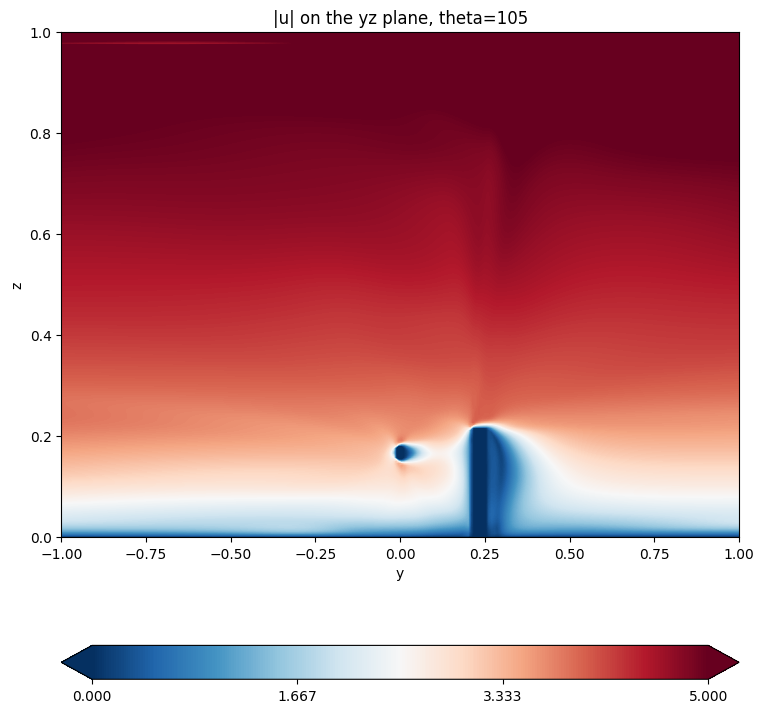

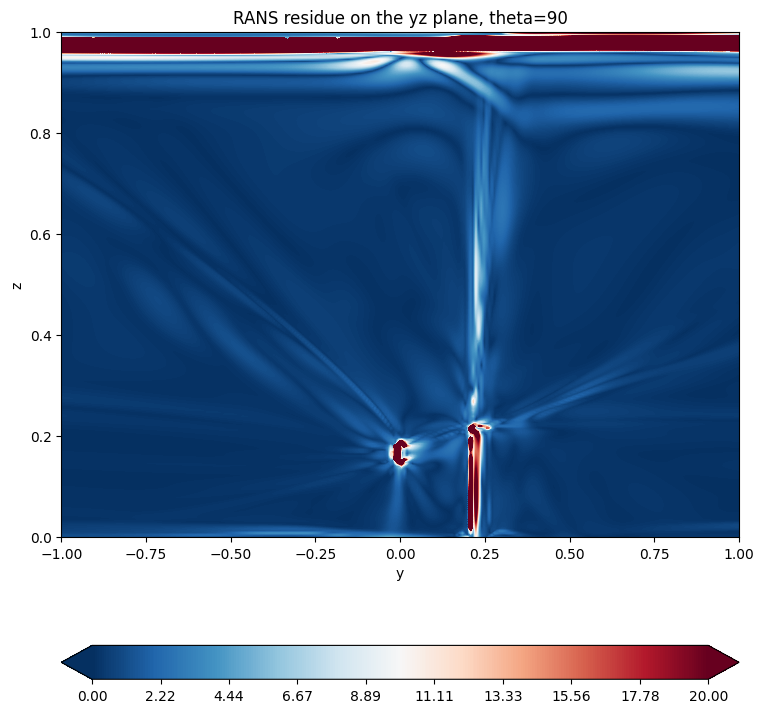

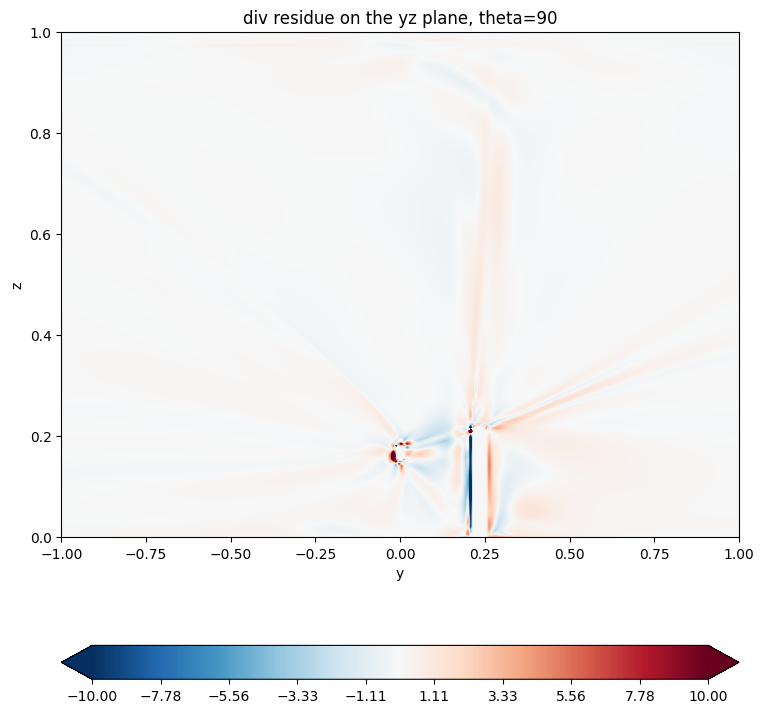

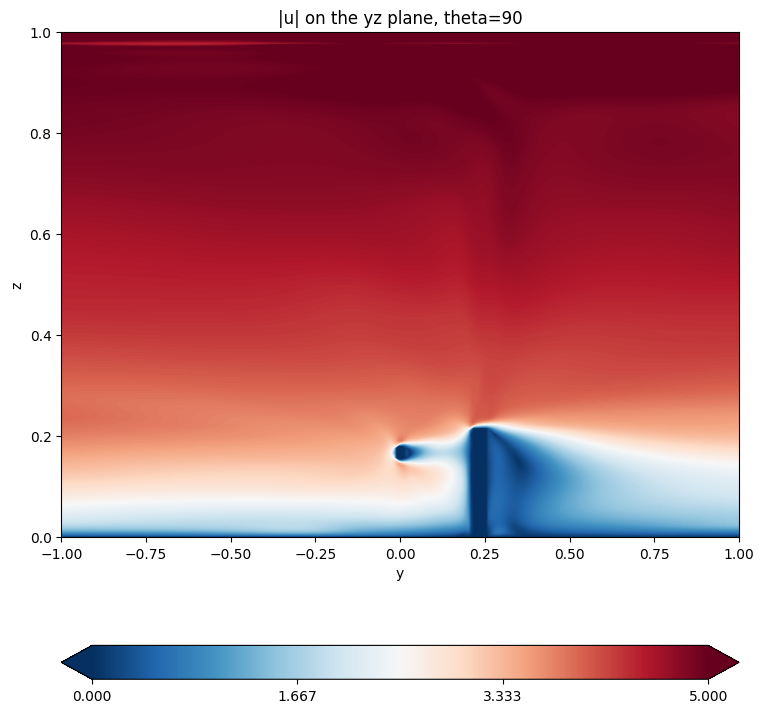

In [7]:
# test on yz plane
U = 4.043564066
resolution = 256
test_x = 500  # unit: meter

theta_range = np.arange(270, 90-15, -15)

for theta in theta_range:
    test_theta = np.deg2rad(theta)
    
    y = np.linspace(-1, 1, resolution)
    z = np.linspace(0, 1, resolution)
    y_grid, z_grid = np.meshgrid(y, z)
    y_test = np.reshape(y_grid, (-1, 1))
    z_test = np.reshape(z_grid, (-1, 1))
    x_test = np.ones_like(y_test) * (test_x - 500) / 300.0
    theta_test = np.ones_like(y_test) * test_theta
    
    x_test = tf.cast(x_test, dtype=data_type)
    y_test = tf.cast(y_test, dtype=data_type)
    z_test = tf.cast(z_test, dtype=data_type)
    theta_test = tf.cast(theta_test, dtype=data_type)
    
    loss_rans, loss_div = compute_PDE_residues(x_test, y_test, z_test, theta_test)
    
    loss_rans = tf.reshape(loss_rans, y_grid.shape)
    loss_div = tf.reshape(loss_div, y_grid.shape)
    
    # plot xy slice for rans
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(y_grid, z_grid, loss_rans, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,20,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,20,10, endpoint=True))
    plt.xlabel("y")
    plt.ylabel("z")
    ax.set_title(f'RANS residue on the yz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xy slice for div
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(y_grid, z_grid, loss_div, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(-10,10,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(-10,10,10, endpoint=True)) 
    plt.xlabel("y")
    plt.ylabel("z")
    ax.set_title(f'div residue on the yz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xy slice for u norm
    test_data = tf.concat([x_test, y_test, z_test, theta_test], axis=1)
    test_data = tf.cast(test_data, dtype=data_type)
    ux_pred = ux_model(test_data) * U
    uy_pred = uy_model(test_data) * U
    uz_pred = uz_model(test_data) * U
    u_norm = np.linalg.norm(tf.concat([ux_pred, uy_pred, uz_pred], axis=1), axis=1)
    u_norm = tf.reshape(u_norm, y_grid.shape)
    
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(y_grid, z_grid, u_norm, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,5,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,5,4, endpoint=True))
    
    # plot wind direction
#     wind_dir = np.array([np.cos(test_theta), np.sin(test_theta)])
#     ax.quiver(0, 0.7, wind_dir[0], wind_dir[1], color="k", scale=10, width=0.001, headwidth=4, headlength=4, headaxislength=3)
    
    plt.xlabel("y")
    plt.ylabel("z")
    ax.set_title(f'|u| on the yz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()

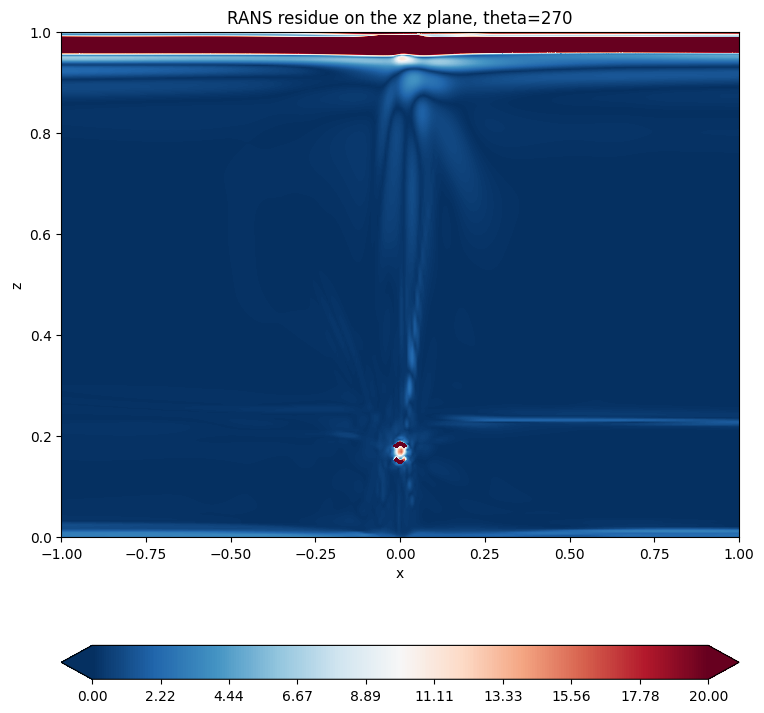

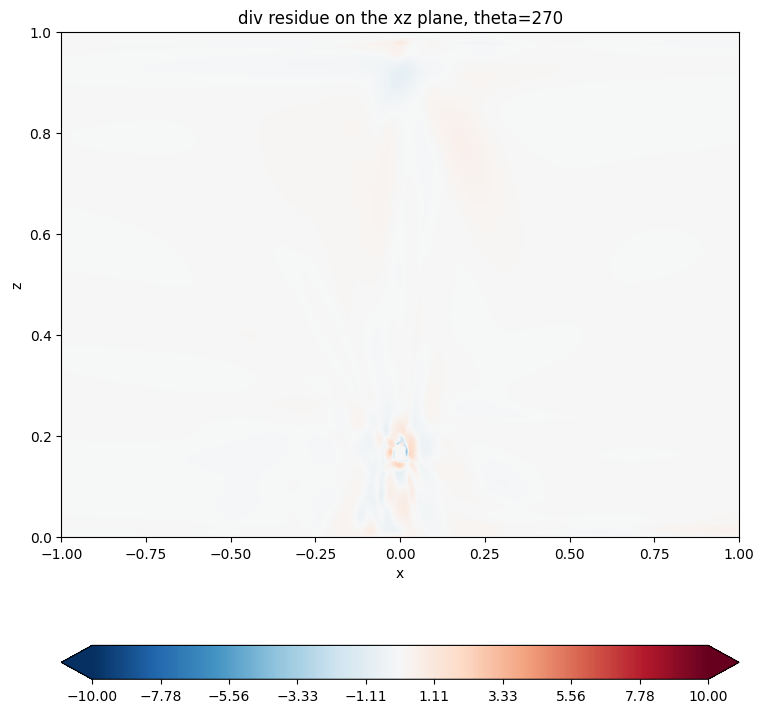

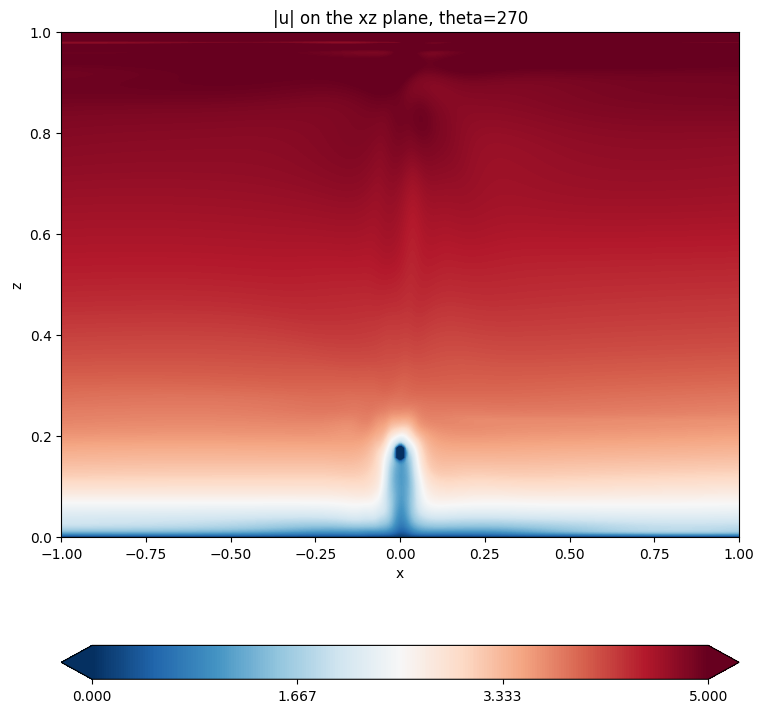

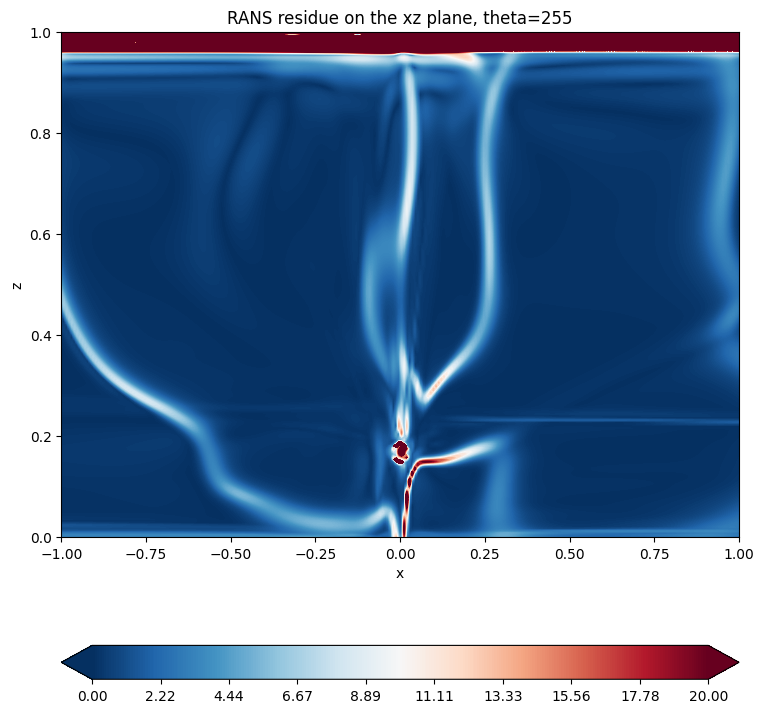

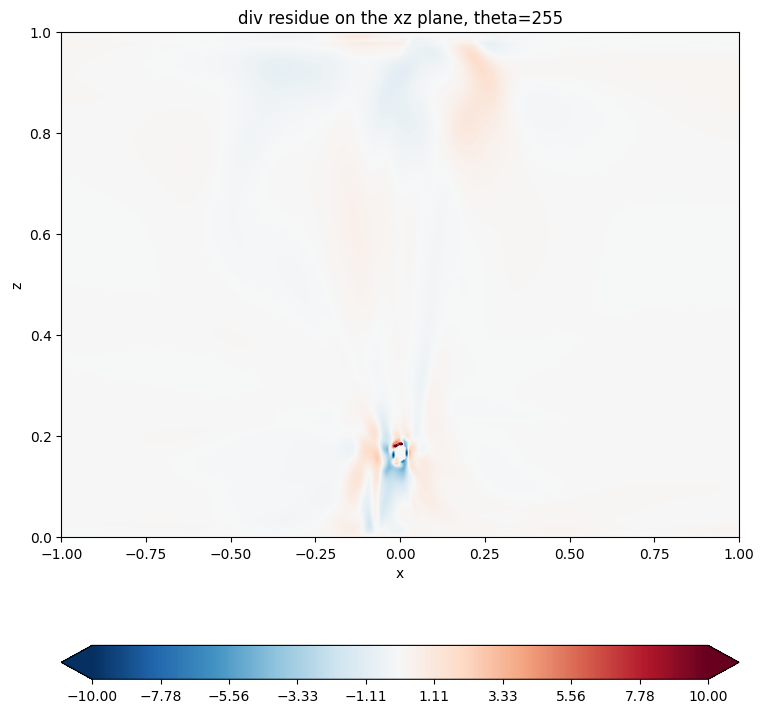

...

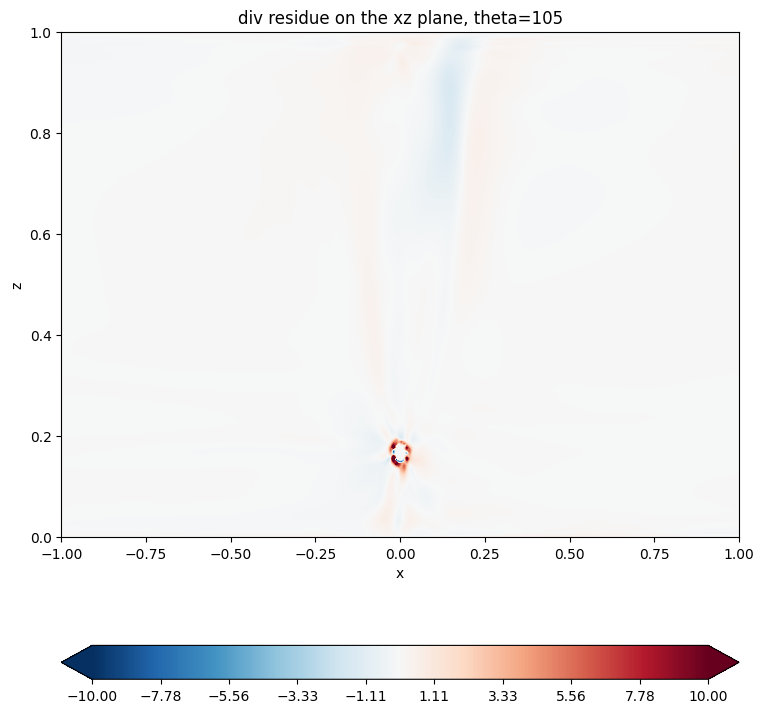

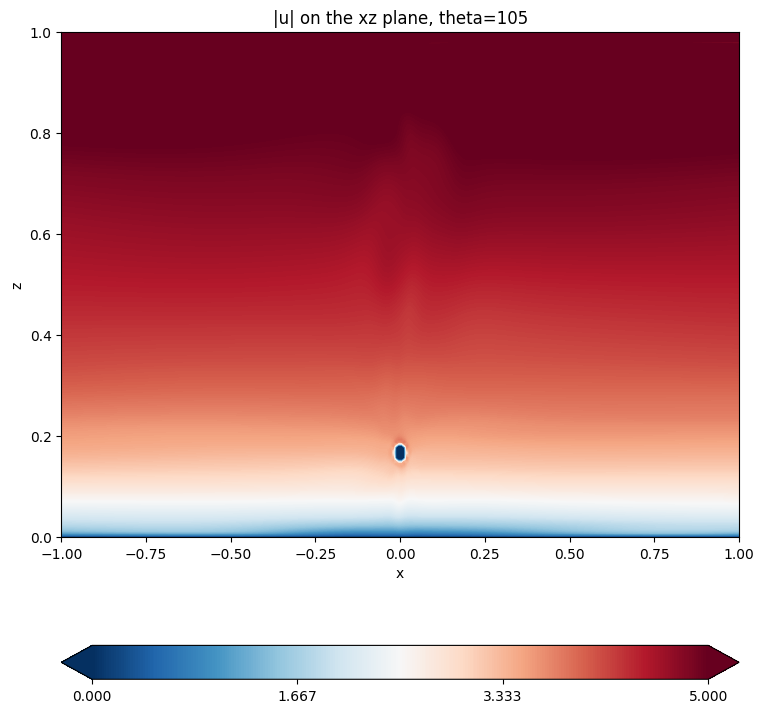

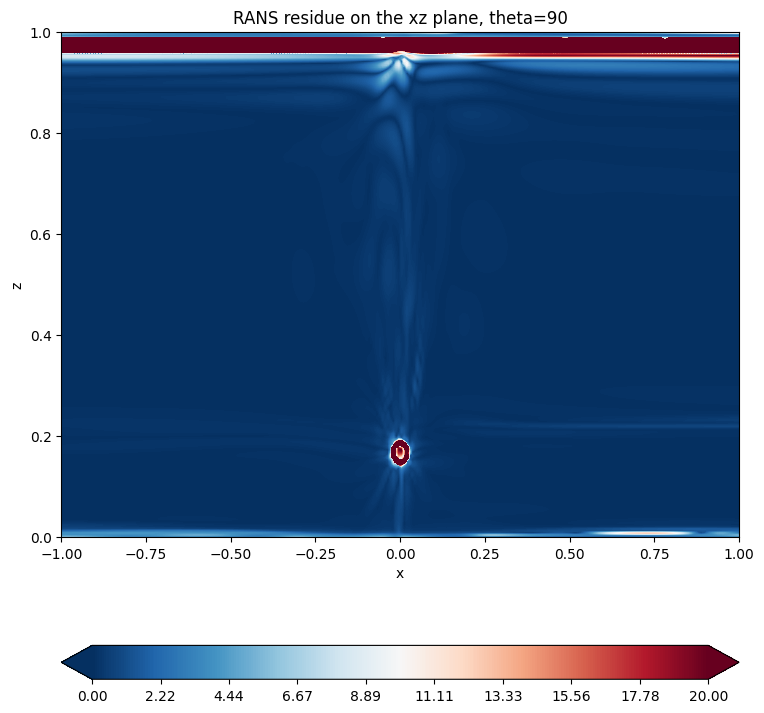

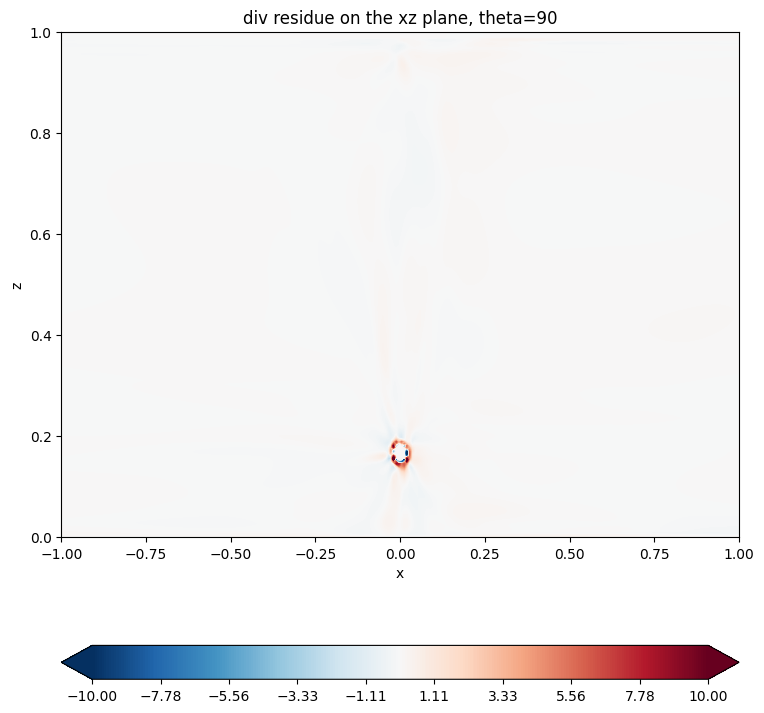

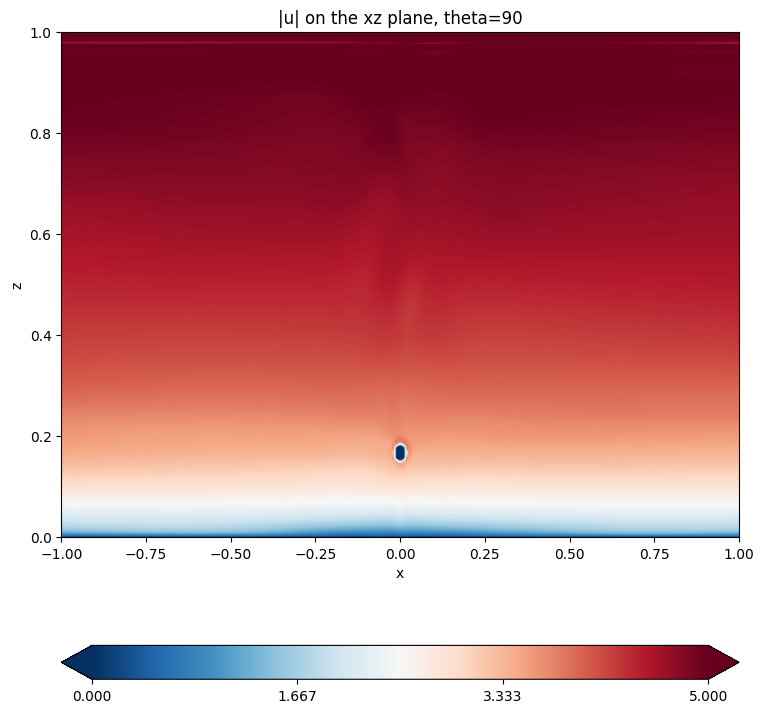

In [8]:
# test on xz plane
U = 4.043564066
resolution = 256
test_y = 500  # unit: meter

theta_range = np.arange(270, 90-15, -15)

for theta in theta_range:
    test_theta = np.deg2rad(theta)
    
    x = np.linspace(-1, 1, resolution)
    z = np.linspace(0, 1, resolution)
    x_grid, z_grid = np.meshgrid(x, z)
    x_test = np.reshape(x_grid, (-1, 1))
    z_test = np.reshape(z_grid, (-1, 1))
    y_test = np.ones_like(x_test) * (test_y - 500) / 300.0
    theta_test = np.ones_like(y_test) * test_theta
    
    x_test = tf.cast(x_test, dtype=data_type)
    y_test = tf.cast(y_test, dtype=data_type)
    z_test = tf.cast(z_test, dtype=data_type)
    theta_test = tf.cast(theta_test, dtype=data_type)
    
    loss_rans, loss_div = compute_PDE_residues(x_test, y_test, z_test, theta_test)
    
    loss_rans = tf.reshape(loss_rans, x_grid.shape)
    loss_div = tf.reshape(loss_div, x_grid.shape)
    
    # plot xz slice for rans
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, z_grid, loss_rans, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,20,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,20,10, endpoint=True))
    plt.xlabel("x")
    plt.ylabel("z")
    ax.set_title(f'RANS residue on the xz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xz slice for div
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, z_grid, loss_div, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(-10,10,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(-10,10,10, endpoint=True)) 
    plt.xlabel("x")
    plt.ylabel("z")
    ax.set_title(f'div residue on the xz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xz slice for u norm
    test_data = tf.concat([x_test, y_test, z_test, theta_test], axis=1)
    test_data = tf.cast(test_data, dtype=data_type)
    ux_pred = ux_model(test_data) * U
    uy_pred = uy_model(test_data) * U
    uz_pred = uz_model(test_data) * U
    u_norm = np.linalg.norm(tf.concat([ux_pred, uy_pred, uz_pred], axis=1), axis=1)
    u_norm = tf.reshape(u_norm, x_grid.shape)
    
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, z_grid, u_norm, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,5,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,5,4, endpoint=True))
    
    # plot wind direction
#     wind_dir = np.array([np.cos(test_theta), np.sin(test_theta)])
#     ax.quiver(0, 0.7, wind_dir[0], wind_dir[1], color="k", scale=10, width=0.001, headwidth=4, headlength=4, headaxislength=3)
    
    plt.xlabel("x")
    plt.ylabel("z")
    ax.set_title(f'|u| on the xz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()

In [6]:
optimizer = tf.keras.optimizers.Adam(2e-5)

@tf.function
def train_step(x_, y_, z_, theta_, train_data_cfd, train_label_cfd):
    
    with tf.GradientTape(persistent=True) as tape2:
        
        with tf.GradientTape(persistent=True) as tape1:
            tape1.watch(x_)
            tape1.watch(y_)
            tape1.watch(z_)
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(x_)
                tape.watch(y_)
                tape.watch(z_)
                
                # for NN inputs
                points_ = tf.concat([x_, y_, z_, theta_], axis=1)
                
                # forward pass
                ux = ux_model(points_)
                uy = uy_model(points_)
                uz = uz_model(points_)
                p = NN_p(points_)
                nut = NN_nut(points_)
                
            dux_dx = tape.gradient(ux, x_)
            dux_dy = tape.gradient(ux, y_)
            dux_dz = tape.gradient(ux, z_)
            
            duy_dx = tape.gradient(uy, x_)
            duy_dy = tape.gradient(uy, y_)
            duy_dz = tape.gradient(uy, z_)
            
            duz_dx = tape.gradient(uz, x_)
            duz_dy = tape.gradient(uz, y_)
            duz_dz = tape.gradient(uz, z_)
            
            dp_dx = tape.gradient(p, x_)
            dp_dy = tape.gradient(p, y_)
            dp_dz = tape.gradient(p, z_)
            
            dnut_dx = tape.gradient(nut, x_)
            dnut_dy = tape.gradient(nut, y_)
            dnut_dz = tape.gradient(nut, z_)
        
        d2ux_dx2 = tape1.gradient(dux_dx, x_)
        d2ux_dy2 = tape1.gradient(dux_dy, y_)
        d2ux_dz2 = tape1.gradient(dux_dz, z_)
        
        d2uy_dx2 = tape1.gradient(duy_dx, x_)
        d2uy_dy2 = tape1.gradient(duy_dy, y_)
        d2uy_dz2 = tape1.gradient(duy_dz, z_)
        
        d2uz_dx2 = tape1.gradient(duz_dx, x_)
        d2uz_dy2 = tape1.gradient(duz_dy, y_)
        d2uz_dz2 = tape1.gradient(duz_dz, z_)
            
        # term 1
        term_1_x = dux_dx * ux + dux_dy * uy + dux_dz * uz
        term_1_y = duy_dx * ux + duy_dy * uy + duy_dz * uz
        term_1_z = duz_dx * ux + duz_dy * uy + duz_dz * uz
        
        # term 2
        term_2_x = -dp_dx
        term_2_y = -dp_dy
        term_2_z = -dp_dz
        
        # term 3
        term_3_x = nut * (d2ux_dx2 + d2ux_dy2 + d2ux_dz2)
        term_3_y = nut * (d2uy_dx2 + d2uy_dy2 + d2uy_dz2)
        term_3_z = nut * (d2uz_dx2 + d2uz_dy2 + d2uz_dz2)

        # term 4
        term_4_x = dnut_dx * (dux_dx + dux_dx) + dnut_dy * (dux_dy + duy_dx) + dnut_dz * (dux_dz + duz_dx)
        term_4_y = dnut_dx * (duy_dx + dux_dy) + dnut_dy * (duy_dy + duy_dy) + dnut_dz * (duy_dz + duz_dy)
        term_4_z = dnut_dx * (duz_dx + dux_dz) + dnut_dy * (duz_dy + duy_dz) + dnut_dz * (duz_dz + duz_dz)
        
        # RANS
        residue_rans_x = term_1_x - term_2_x - term_3_x - term_4_x
        residue_rans_y = term_1_y - term_2_y - term_3_y - term_4_y
        residue_rans_z = term_1_z - term_2_z - term_3_z - term_4_z
        loss_rans = tf.math.reduce_mean(tf.math.square(residue_rans_x) + tf.math.square(residue_rans_y) + tf.math.square(residue_rans_z))

        # div
        div = dux_dx + duy_dy + duz_dz
        loss_div = tf.math.reduce_mean(tf.math.square(div))
        
        # fitting loss
        ux_1 = ux_model(train_data_cfd)
        uy_1 = uy_model(train_data_cfd)
        uz_1 = uz_model(train_data_cfd)
        p_1 = NN_p(train_data_cfd)
        nut_1 = NN_nut(train_data_cfd)

        flow_attribute_pred = tf.concat([ux_1, uy_1, uz_1, p_1, nut_1], axis=1)
        loss_fit = tf.math.reduce_mean(tf.math.square(flow_attribute_pred - train_label_cfd)) * 5
        
#         loss_fit = tf.math.reduce_mean(
#                                        tf.math.square(ux_1 - tf.reshape(train_label_cfd[:, 0], [-1, 1]))
#                                      + tf.math.square(uy_1 - tf.reshape(train_label_cfd[:, 1], [-1, 1]))
#                                      + tf.math.square(uz_1 - tf.reshape(train_label_cfd[:, 2], [-1, 1]))
#                                      + tf.math.square(p_1 - tf.reshape(train_label_cfd[:, 3], [-1, 1]))
#                                      + tf.math.square(nut_1 - tf.reshape(train_label_cfd[:, 4], [-1, 1]))
#         )

        
        # total loss
        # times 0.1 for loss ralated to equations
        loss = loss_fit + (loss_rans + loss_div) * 1e-3
        
    # apply gradient
    grad_ux = tape2.gradient(loss, NN_ux.trainable_variables)
    grad_uy = tape2.gradient(loss, NN_uy.trainable_variables)
    grad_uz = tape2.gradient(loss, NN_uz.trainable_variables)
    grad_p = tape2.gradient(loss, NN_p.trainable_variables)
    grad_nut = tape2.gradient(loss, NN_nut.trainable_variables)
    
    optimizer.apply_gradients(zip(grad_ux, NN_ux.trainable_variables))
    optimizer.apply_gradients(zip(grad_uy, NN_uy.trainable_variables))
    optimizer.apply_gradients(zip(grad_uz, NN_uz.trainable_variables))
    optimizer.apply_gradients(zip(grad_p, NN_p.trainable_variables))
    optimizer.apply_gradients(zip(grad_nut, NN_nut.trainable_variables))

    del tape
    del tape1
    del tape2
    
    return loss, loss_fit

loss_total_list = []
loss_fit_list = []


num_epochs = 10

start = time.time()
for i in range(num_epochs):
    
    loss_batch_list = []
    loss_fit_part_list = []
    for PDE_pts, (CFD_pts, CFD_labels) in zip(train_dataset_PDE, train_dataset_CFD):
        x_train = tf.reshape(PDE_pts[:, 0], (-1, 1))
        y_train = tf.reshape(PDE_pts[:, 1], (-1, 1))
        z_train = tf.reshape(PDE_pts[:, 2], (-1, 1))
        theta_train = tf.reshape(PDE_pts[:, 3], (-1, 1))
        loss, loss_fit_part = train_step(x_train, y_train, z_train, theta_train, CFD_pts, CFD_labels)
        loss_batch_list.append(loss)
        loss_fit_part_list.append(loss_fit_part)
    loss_epoch = tf.math.reduce_mean(loss_batch_list)
    loss_fit_part_epoch = tf.math.reduce_mean(loss_fit_part_list)
    
    print("epoch: ", i, "loss: ", loss_epoch.numpy(), "loss fit: ", loss_fit_part_epoch.numpy())
    
    loss_total_list.append(loss_epoch)
    loss_fit_list.append(loss_fit_part_epoch)
    

print(f"time taken: {(time.time() - start)/60} minutes")

epoch:  0 loss:  1.6081393198711655 loss fit:  0.00671016164665615
epoch:  1 loss:  0.45407866906067534 loss fit:  0.007537680709673402
epoch:  2 loss:  0.20617387767460157 loss fit:  0.007600147923475417
epoch:  3 loss:  0.12126610592619576 loss fit:  0.007357818154322564
epoch:  4 loss:  0.07989837514804395 loss fit:  0.0072357639627608815
epoch:  5 loss:  0.06346256112041687 loss fit:  0.006984807758817808
epoch:  6 loss:  0.050844434353231424 loss fit:  0.006753419185158355
epoch:  7 loss:  0.043441867079092485 loss fit:  0.0065398966437133325
epoch:  8 loss:  0.03749900229194301 loss fit:  0.006344510116463621
epoch:  9 loss:  0.034710873953209036 loss fit:  0.006207677280355173
time taken: 6.768902063369751 minutes


In [7]:
start = time.time()
for i in range(10):
    
    loss_batch_list = []
    loss_fit_part_list = []
    for PDE_pts, (CFD_pts, CFD_labels) in zip(train_dataset_PDE, train_dataset_CFD):
        x_train = tf.reshape(PDE_pts[:, 0], (-1, 1))
        y_train = tf.reshape(PDE_pts[:, 1], (-1, 1))
        z_train = tf.reshape(PDE_pts[:, 2], (-1, 1))
        theta_train = tf.reshape(PDE_pts[:, 3], (-1, 1))
        loss, loss_fit_part = train_step(x_train, y_train, z_train, theta_train, CFD_pts, CFD_labels)
        loss_batch_list.append(loss)
        loss_fit_part_list.append(loss_fit_part)
    loss_epoch = tf.math.reduce_mean(loss_batch_list)
    loss_fit_part_epoch = tf.math.reduce_mean(loss_fit_part_list)
    
    print("epoch: ", i+10, "loss: ", loss_epoch.numpy(), "loss fit: ", loss_fit_part_epoch.numpy())
    
    loss_total_list.append(loss_epoch)
    loss_fit_list.append(loss_fit_part_epoch)
    

print(f"time taken: {(time.time() - start)/60} minutes")

epoch:  10 loss:  0.030952351469427514 loss fit:  0.006060164016418199
epoch:  11 loss:  0.028992662659587158 loss fit:  0.00595519267324271
epoch:  12 loss:  0.027309489172431155 loss fit:  0.005864781816383884
epoch:  13 loss:  0.025548364375479995 loss fit:  0.005758422777117634
epoch:  14 loss:  0.025268209246804844 loss fit:  0.005685150078724449
epoch:  15 loss:  0.023725780398290267 loss fit:  0.005621253101583996
epoch:  16 loss:  0.02293951373656449 loss fit:  0.005535123680783231
epoch:  17 loss:  0.023406250101916132 loss fit:  0.005510708720710543
epoch:  18 loss:  0.021696881180852255 loss fit:  0.005414847106357158
epoch:  19 loss:  0.021113787700127475 loss fit:  0.005333408923452299
time taken: 6.267912292480469 minutes


In [17]:
start = time.time()
for i in range(10):
    
    loss_batch_list = []
    loss_fit_part_list = []
    for PDE_pts, (CFD_pts, CFD_labels) in zip(train_dataset_PDE, train_dataset_CFD):
        x_train = tf.reshape(PDE_pts[:, 0], (-1, 1))
        y_train = tf.reshape(PDE_pts[:, 1], (-1, 1))
        z_train = tf.reshape(PDE_pts[:, 2], (-1, 1))
        theta_train = tf.reshape(PDE_pts[:, 3], (-1, 1))
        loss, loss_fit_part = train_step(x_train, y_train, z_train, theta_train, CFD_pts, CFD_labels)
        loss_batch_list.append(loss)
        loss_fit_part_list.append(loss_fit_part)
    loss_epoch = tf.math.reduce_mean(loss_batch_list)
    loss_fit_part_epoch = tf.math.reduce_mean(loss_fit_part_list)
    
    print("epoch: ", i+20, "loss: ", loss_epoch.numpy(), "loss fit: ", loss_fit_part_epoch.numpy())
    
    loss_total_list.append(loss_epoch)
    loss_fit_list.append(loss_fit_part_epoch)
    

print(f"time taken: {(time.time() - start)/60} minutes")

epoch:  20 loss:  0.02085069798715822 loss fit:  0.005234079044288406
epoch:  21 loss:  0.022694941996787413 loss fit:  0.005183641855000584
epoch:  22 loss:  0.02007920133973979 loss fit:  0.00509453796062998
epoch:  23 loss:  0.019298356731851932 loss fit:  0.004943890815498367
epoch:  24 loss:  0.019252280337419065 loss fit:  0.004835767771679152
epoch:  25 loss:  0.019610789229751915 loss fit:  0.004789368919672396
epoch:  26 loss:  0.018843869976607464 loss fit:  0.004749944289012771
epoch:  27 loss:  0.018299574303978494 loss fit:  0.004687434988235565
epoch:  28 loss:  0.01864521425338327 loss fit:  0.004696200893236961
epoch:  29 loss:  0.018203989534995323 loss fit:  0.004658993457862559
time taken: 6.273003494739532 minutes


In [18]:
start = time.time()
for i in range(10):
    
    loss_batch_list = []
    loss_fit_part_list = []
    for PDE_pts, (CFD_pts, CFD_labels) in zip(train_dataset_PDE, train_dataset_CFD):
        x_train = tf.reshape(PDE_pts[:, 0], (-1, 1))
        y_train = tf.reshape(PDE_pts[:, 1], (-1, 1))
        z_train = tf.reshape(PDE_pts[:, 2], (-1, 1))
        theta_train = tf.reshape(PDE_pts[:, 3], (-1, 1))
        loss, loss_fit_part = train_step(x_train, y_train, z_train, theta_train, CFD_pts, CFD_labels)
        loss_batch_list.append(loss)
        loss_fit_part_list.append(loss_fit_part)
    loss_epoch = tf.math.reduce_mean(loss_batch_list)
    loss_fit_part_epoch = tf.math.reduce_mean(loss_fit_part_list)
    
    print("epoch: ", i+30, "loss: ", loss_epoch.numpy(), "loss fit: ", loss_fit_part_epoch.numpy())
    
    loss_total_list.append(loss_epoch)
    loss_fit_list.append(loss_fit_part_epoch)
    

print(f"time taken: {(time.time() - start)/60} minutes")

epoch:  30 loss:  0.0180089065810314 loss fit:  0.004652468333072478
epoch:  31 loss:  0.017813391373407234 loss fit:  0.004658949480409906
epoch:  32 loss:  0.018942721510322502 loss fit:  0.004709852187697877
epoch:  33 loss:  0.01825204864570585 loss fit:  0.004726288028536819
epoch:  34 loss:  0.01761236834378904 loss fit:  0.004721452988858226
epoch:  35 loss:  0.020625924685879288 loss fit:  0.00490972727983639
epoch:  36 loss:  0.017712050904604967 loss fit:  0.005139737231967838
epoch:  37 loss:  0.018092008413798166 loss fit:  0.005518768637645003
epoch:  38 loss:  0.01724692832851671 loss fit:  0.004812774482242487
epoch:  39 loss:  0.016772432303603542 loss fit:  0.004749254532251232
time taken: 6.271517674128215 minutes


In [25]:
optimizer = tf.keras.optimizers.Adam(1e-5)

start = time.time()
for i in range(10):
    
    loss_batch_list = []
    loss_fit_part_list = []
    for PDE_pts, (CFD_pts, CFD_labels) in zip(train_dataset_PDE, train_dataset_CFD):
        x_train = tf.reshape(PDE_pts[:, 0], (-1, 1))
        y_train = tf.reshape(PDE_pts[:, 1], (-1, 1))
        z_train = tf.reshape(PDE_pts[:, 2], (-1, 1))
        theta_train = tf.reshape(PDE_pts[:, 3], (-1, 1))
        loss, loss_fit_part = train_step(x_train, y_train, z_train, theta_train, CFD_pts, CFD_labels)
        loss_batch_list.append(loss)
        loss_fit_part_list.append(loss_fit_part)
    loss_epoch = tf.math.reduce_mean(loss_batch_list)
    loss_fit_part_epoch = tf.math.reduce_mean(loss_fit_part_list)
    
    print("epoch: ", i+40, "loss: ", loss_epoch.numpy(), "loss fit: ", loss_fit_part_epoch.numpy())
    
    loss_total_list.append(loss_epoch)
    loss_fit_list.append(loss_fit_part_epoch)
    

print(f"time taken: {(time.time() - start)/60} minutes")

epoch:  40 loss:  0.016709653056251127 loss fit:  0.004720025437950712
epoch:  41 loss:  0.016963678407243263 loss fit:  0.004767109520536852
epoch:  42 loss:  0.016331852801847867 loss fit:  0.004737846514793001
epoch:  43 loss:  0.017248810792595264 loss fit:  0.004798160574244313
epoch:  44 loss:  0.016686157867458352 loss fit:  0.004796182368251113
epoch:  45 loss:  0.016629859486809652 loss fit:  0.00488575171200315
epoch:  46 loss:  0.017720977215510282 loss fit:  0.004883398720228755
epoch:  47 loss:  0.0183974020212512 loss fit:  0.005101819197468363
epoch:  48 loss:  0.015962670331881847 loss fit:  0.004939121028188531
epoch:  49 loss:  0.015644666940403895 loss fit:  0.0048328187824703975
time taken: 6.2650127649307255 minutes


In [26]:

start = time.time()
for i in range(10):
    
    loss_batch_list = []
    loss_fit_part_list = []
    for PDE_pts, (CFD_pts, CFD_labels) in zip(train_dataset_PDE, train_dataset_CFD):
        x_train = tf.reshape(PDE_pts[:, 0], (-1, 1))
        y_train = tf.reshape(PDE_pts[:, 1], (-1, 1))
        z_train = tf.reshape(PDE_pts[:, 2], (-1, 1))
        theta_train = tf.reshape(PDE_pts[:, 3], (-1, 1))
        loss, loss_fit_part = train_step(x_train, y_train, z_train, theta_train, CFD_pts, CFD_labels)
        loss_batch_list.append(loss)
        loss_fit_part_list.append(loss_fit_part)
    loss_epoch = tf.math.reduce_mean(loss_batch_list)
    loss_fit_part_epoch = tf.math.reduce_mean(loss_fit_part_list)
    
    print("epoch: ", i+50, "loss: ", loss_epoch.numpy(), "loss fit: ", loss_fit_part_epoch.numpy())
    
    loss_total_list.append(loss_epoch)
    loss_fit_list.append(loss_fit_part_epoch)
    

print(f"time taken: {(time.time() - start)/60} minutes")

epoch:  50 loss:  0.015810082556220975 loss fit:  0.004800744153963202
epoch:  51 loss:  0.01601171427397882 loss fit:  0.004839467285337679
epoch:  52 loss:  0.019776173281763388 loss fit:  0.005220181496067682
epoch:  53 loss:  0.015313405184966333 loss fit:  0.005099569189599826
epoch:  54 loss:  0.015276303570712928 loss fit:  0.004921903204079614
epoch:  55 loss:  0.015622793722888344 loss fit:  0.004889479287095739
epoch:  56 loss:  0.01897832937221307 loss fit:  0.005193940644909444
epoch:  57 loss:  0.015365428333628068 loss fit:  0.005167291808993078
epoch:  58 loss:  0.014910750820131248 loss fit:  0.004972296092506831
epoch:  59 loss:  0.015569906276561542 loss fit:  0.004977076440377709
time taken: 6.282335845629374 minutes


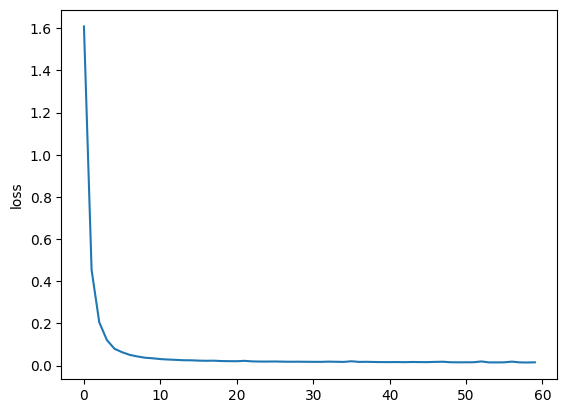

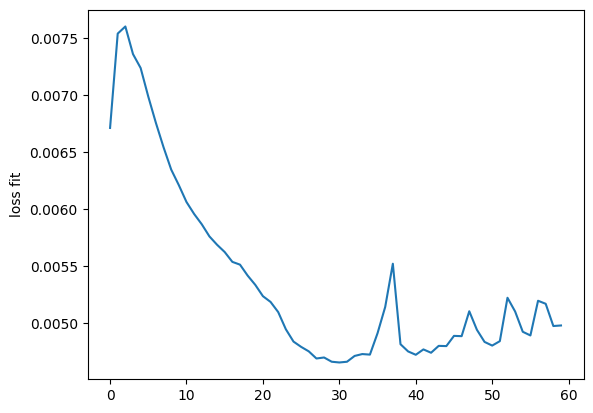

In [27]:
plt.figure()
plt.plot(loss_total_list)
plt.ylabel("loss")
plt.show()

plt.figure()
plt.plot(loss_fit_list)
plt.ylabel("loss fit")
plt.show()

In [28]:
loss_total_list[-1], loss_fit_list[-1]

(<tf.Tensor: shape=(), dtype=float64, numpy=0.015569906276561542>,
 <tf.Tensor: shape=(), dtype=float64, numpy=0.004977076440377709>)

In [31]:
NN_ux.save("./after_RANS_div_refinement_with_CFD_ux", overwrite=True)
NN_uy.save("./after_RANS_div_refinement_with_CFD_uy", overwrite=True)
NN_uz.save("./after_RANS_div_refinement_with_CFD_uz", overwrite=True)
NN_p.save("./after_RANS_div_refinement_with_CFD_p", overwrite=True)
NN_nut.save("./after_RANS_div_refinement_with_CFD_nut", overwrite=True)

INFO:tensorflow:Assets written to: ./after_RANS_div_refinement_with_CFD_ux\assets
INFO:tensorflow:Assets written to: ./after_RANS_div_refinement_with_CFD_uy\assets
INFO:tensorflow:Assets written to: ./after_RANS_div_refinement_with_CFD_uz\assets
INFO:tensorflow:Assets written to: ./after_RANS_div_refinement_with_CFD_p\assets


NotFoundError: {{function_node __wrapped__SaveV2_dtypes_25_device_/job:localhost/replica:0/task:0/device:CPU:0}} Failed to create a NewWriteableFile: ./after_RANS_div_refinement_with_CFD_nut\variables\variables_temp/part-00000-of-00001.data-00000-of-00001.tempstate17874997728074336729 : The system cannot find the path specified.
; No such process [Op:SaveV2]

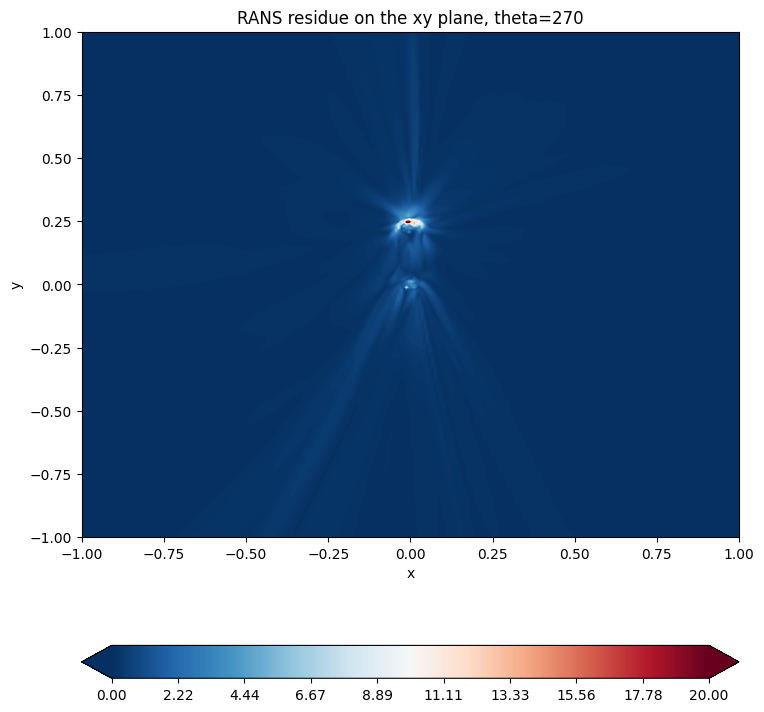

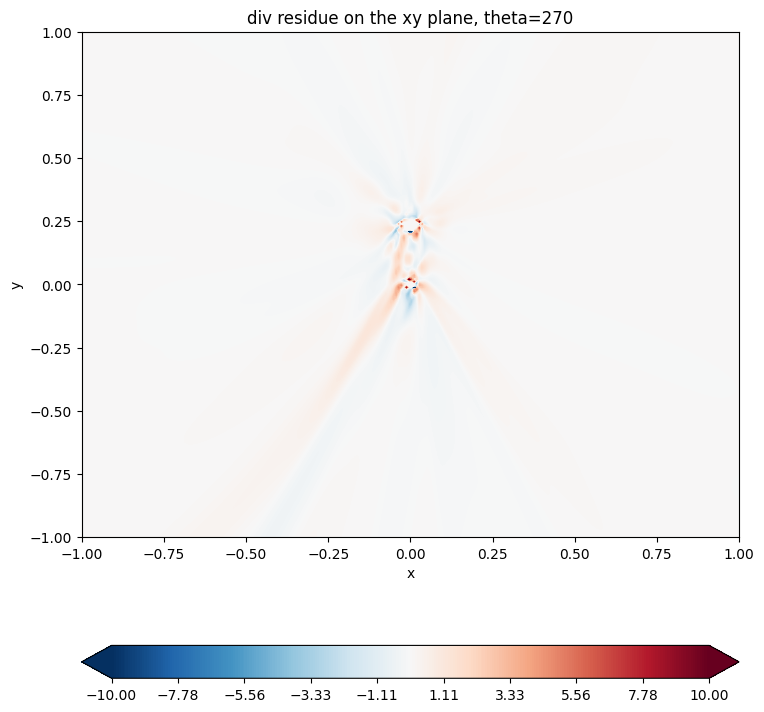

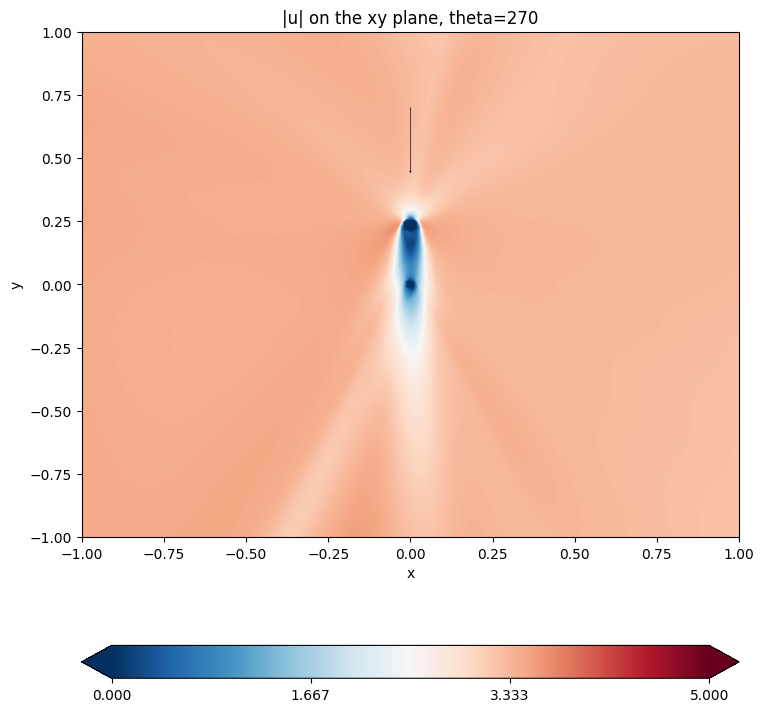

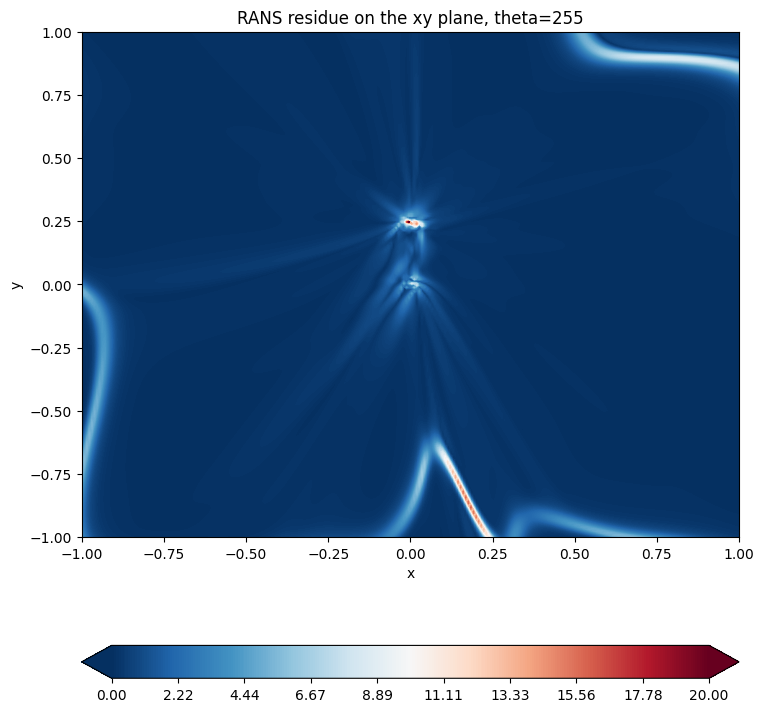

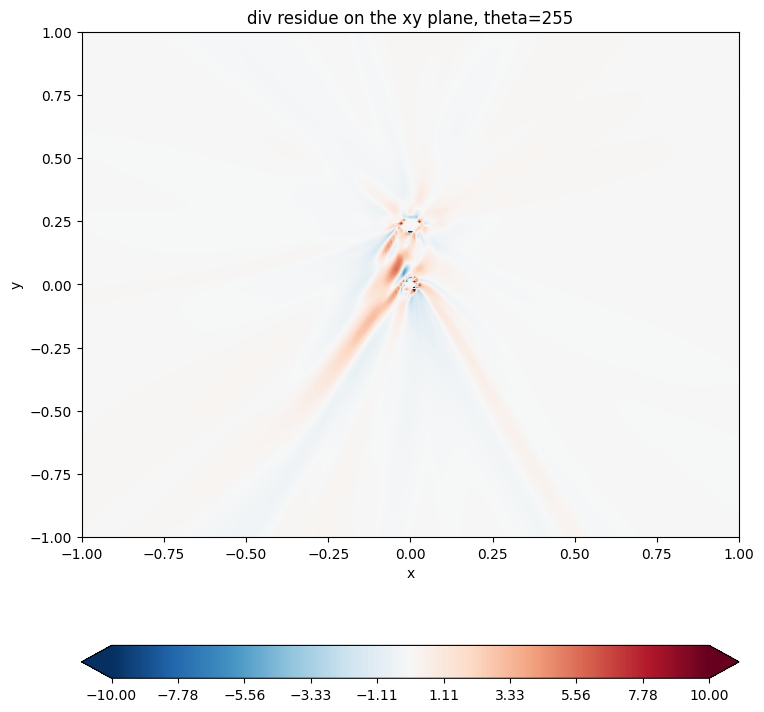

...

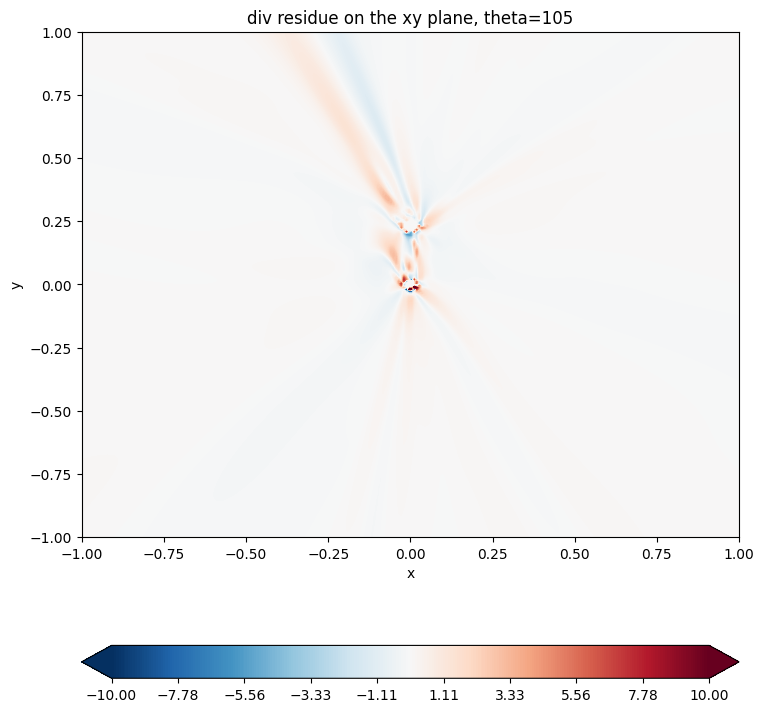

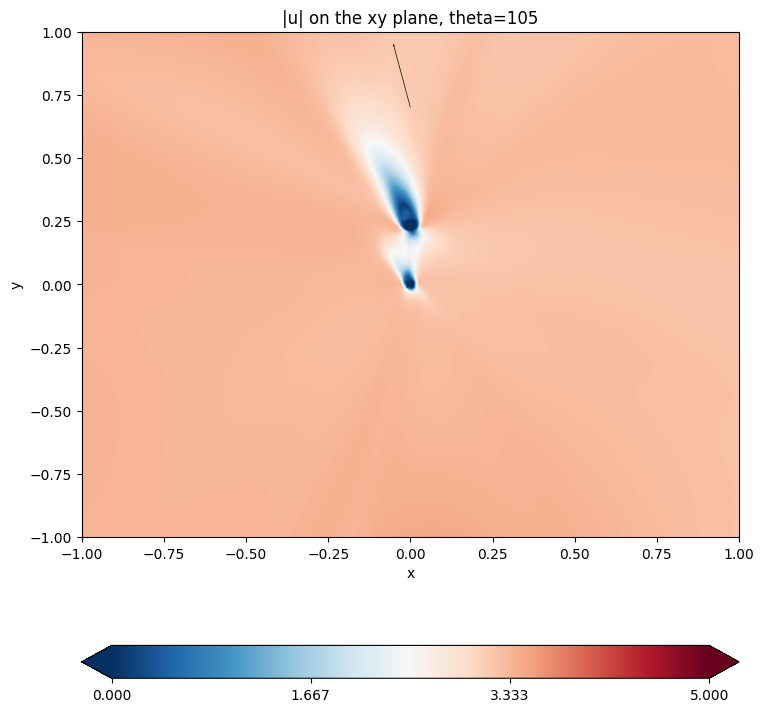

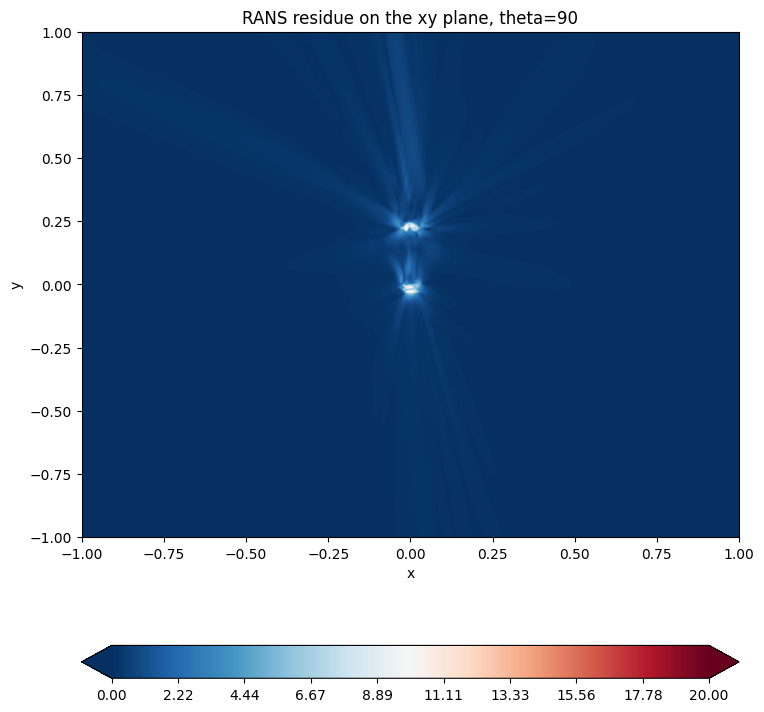

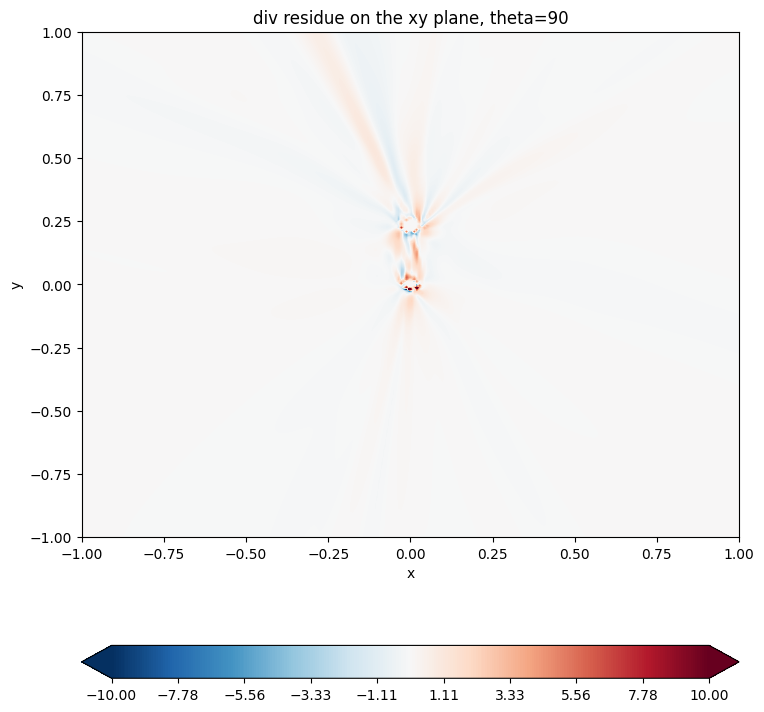

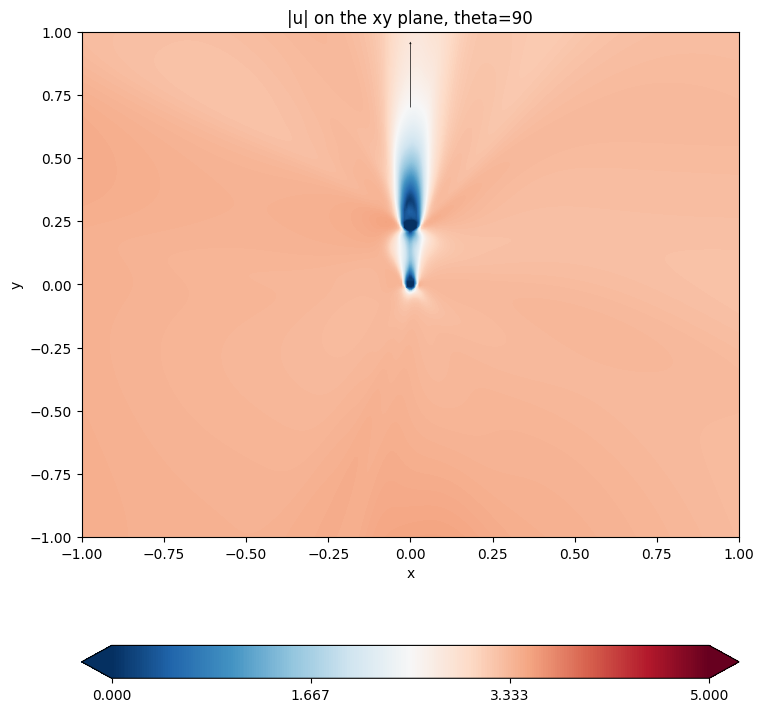

In [32]:
# check after training

# sample on uniform grid and plot the results
# test on xy plane
resolution = 256
test_height = 50  # unit: meter

theta_range = np.arange(270, 90-15, -15)

for theta in theta_range:
    test_theta = np.deg2rad(theta)
    
    x = np.linspace(-1, 1, resolution)
    y = np.linspace(-1, 1, resolution)
    x_grid, y_grid = np.meshgrid(x, y)
    x_test = np.reshape(x_grid, (-1, 1))
    y_test = np.reshape(y_grid, (-1, 1))
    z_test = np.ones_like(x_test) * test_height / 300.0
    theta_test = np.ones_like(x_test) * test_theta
    
    x_test = tf.cast(x_test, dtype=data_type)
    y_test = tf.cast(y_test, dtype=data_type)
    z_test = tf.cast(z_test, dtype=data_type)
    theta_test = tf.cast(theta_test, dtype=data_type)
    
    loss_rans, loss_div = compute_PDE_residues(x_test, y_test, z_test, theta_test)
    
    loss_rans = tf.reshape(loss_rans, x_grid.shape)
    loss_div = tf.reshape(loss_div, x_grid.shape)
    
    # plot xy slice for rans
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, y_grid, loss_rans, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,20,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,20,10, endpoint=True))
    plt.xlabel("x")
    plt.ylabel("y")
    ax.set_title(f'RANS residue on the xy plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xy slice for div
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, y_grid, loss_div, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(-10,10,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(-10,10,10, endpoint=True))
    plt.xlabel("x")
    plt.ylabel("y")
    ax.set_title(f'div residue on the xy plane, theta={theta}')
    # plt.gca().invert_xaxis()
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xy slice for u norm
    test_data = tf.concat([x_test, y_test, z_test, theta_test], axis=1)
    test_data = tf.cast(test_data, dtype=data_type)
    ux_pred = ux_model(test_data) * U
    uy_pred = uy_model(test_data) * U
    uz_pred = uz_model(test_data) * U
    u_norm = np.linalg.norm(tf.concat([ux_pred, uy_pred, uz_pred], axis=1), axis=1)
    u_norm = tf.reshape(u_norm, x_grid.shape)
    
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, y_grid, u_norm, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,5,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,5,4, endpoint=True))
    
    # plot wind direction
    wind_dir = np.array([np.cos(test_theta), np.sin(test_theta)])
    ax.quiver(0, 0.7, wind_dir[0], wind_dir[1], color="k", scale=10, width=0.001, headwidth=4, headlength=4, headaxislength=3)
    
    plt.xlabel("x")
    plt.ylabel("y")
    ax.set_title(f'|u| on the xy plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    

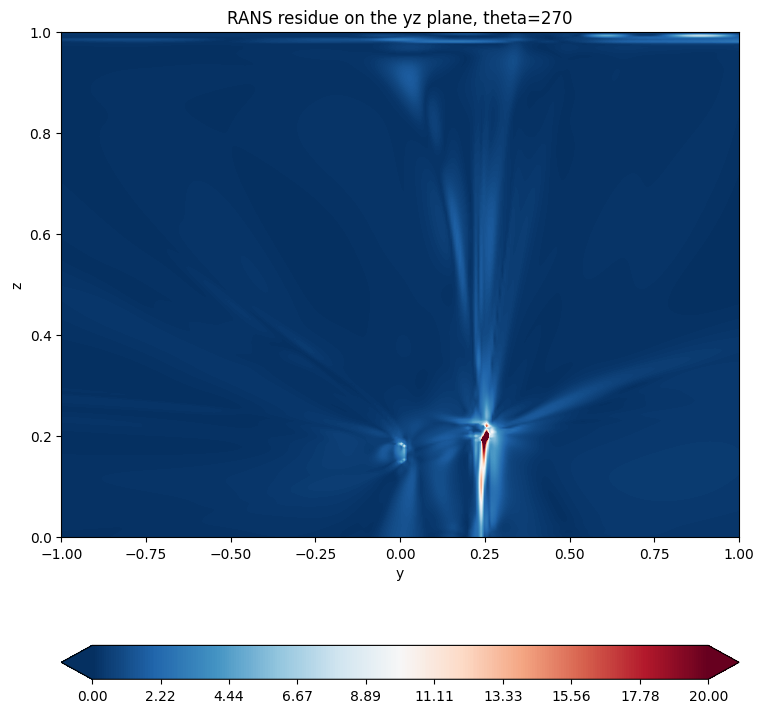

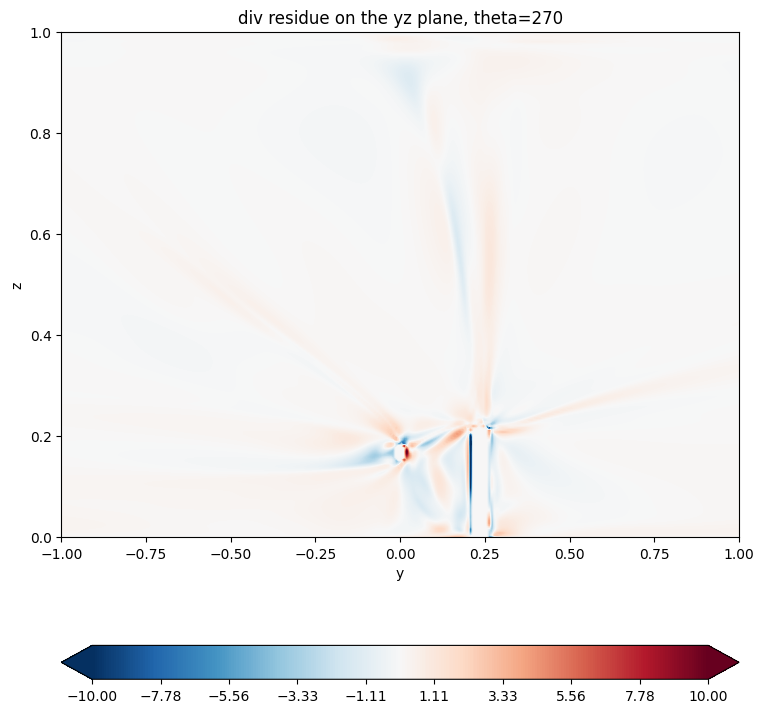

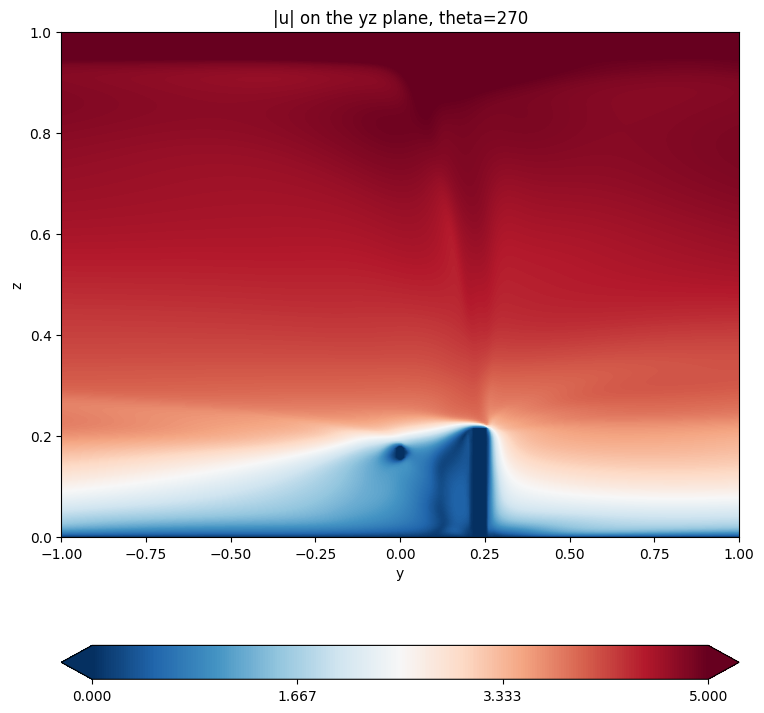

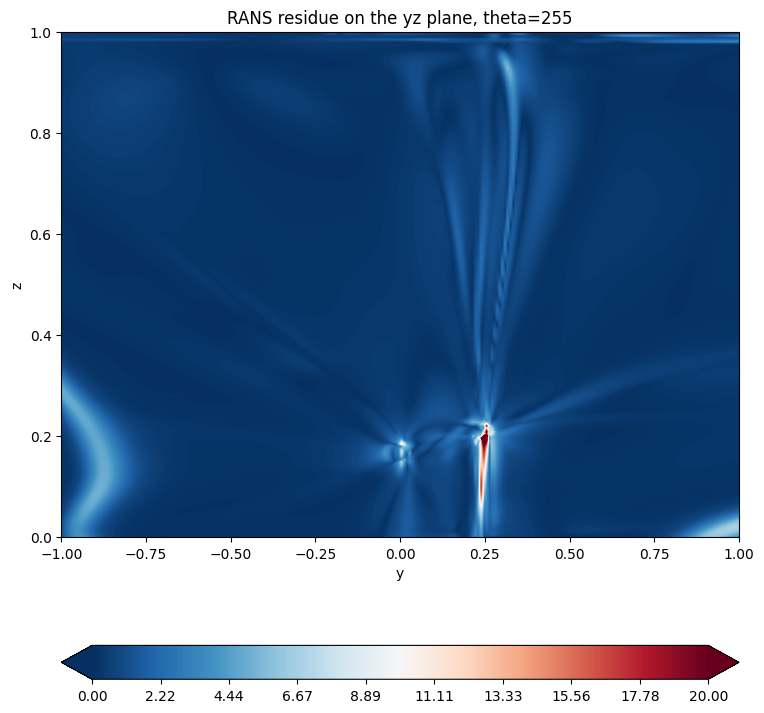

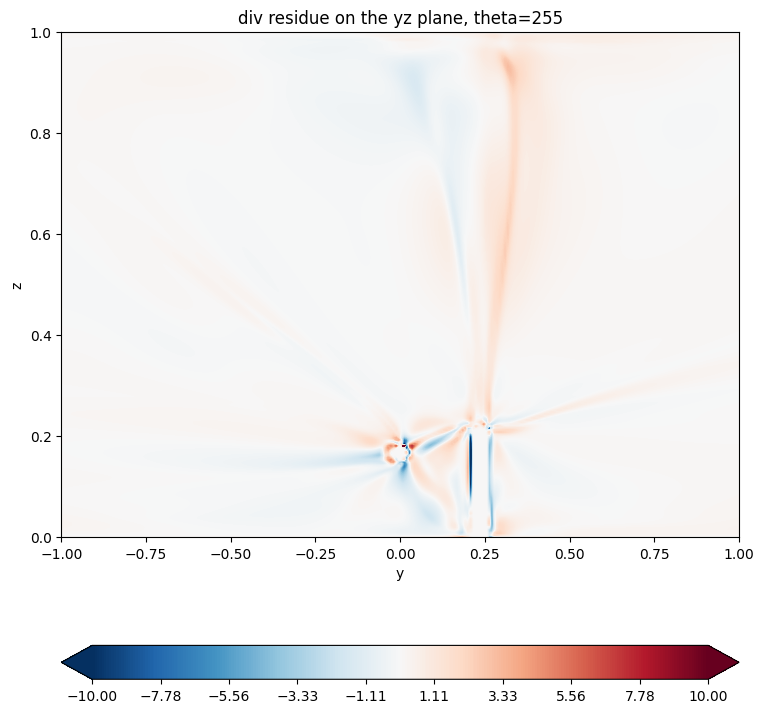

...

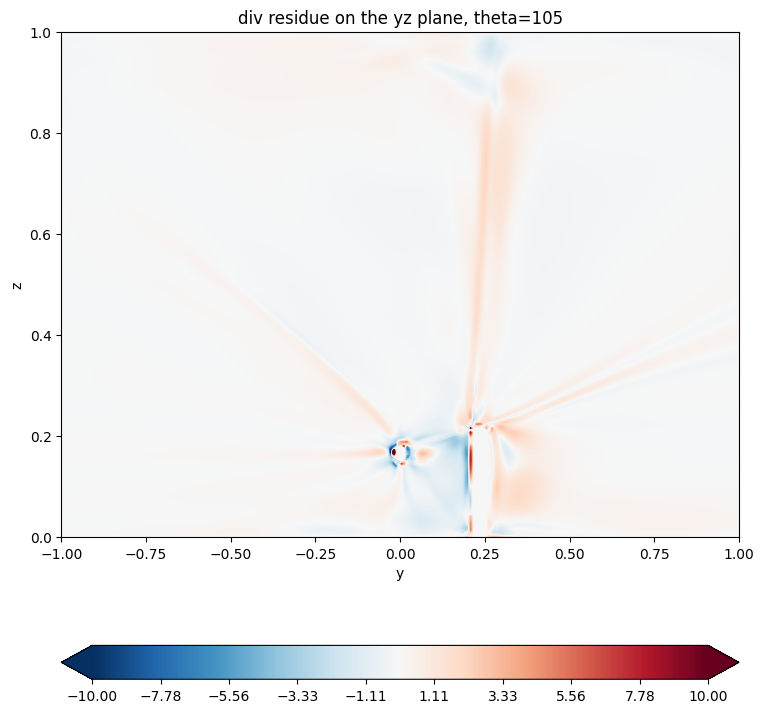

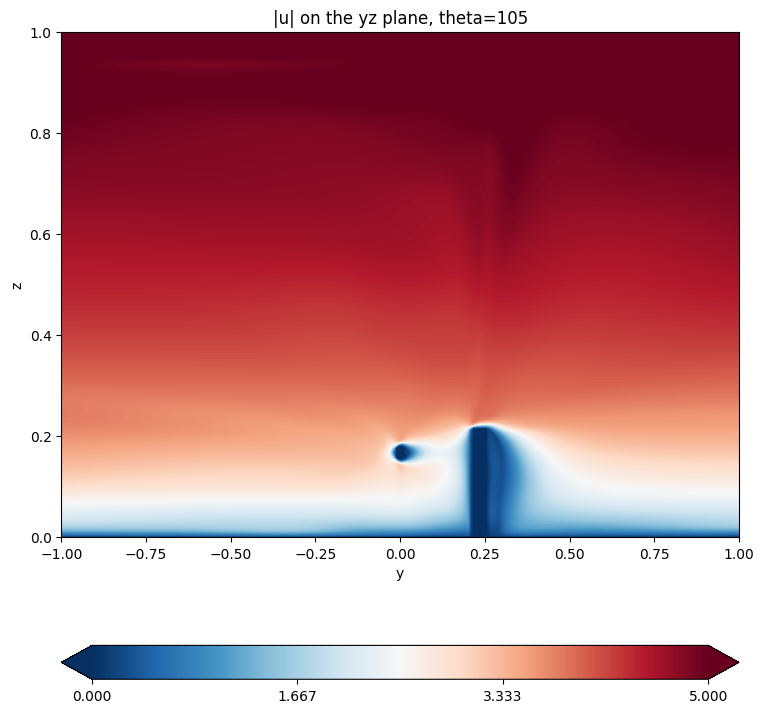

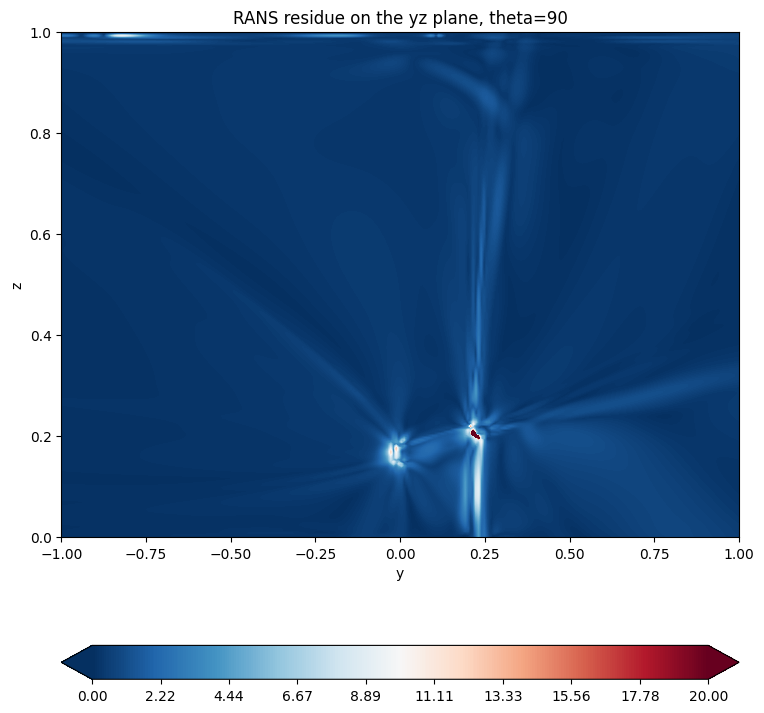

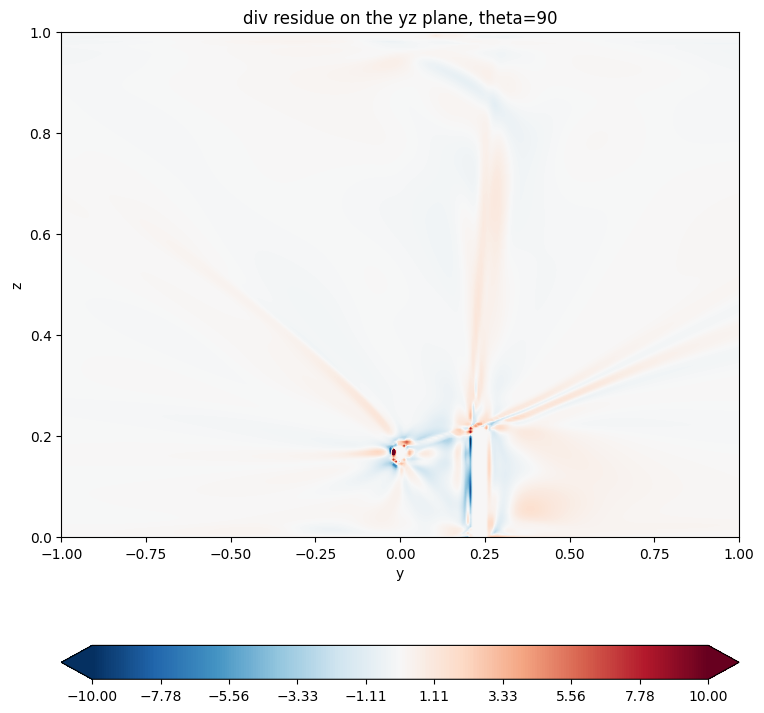

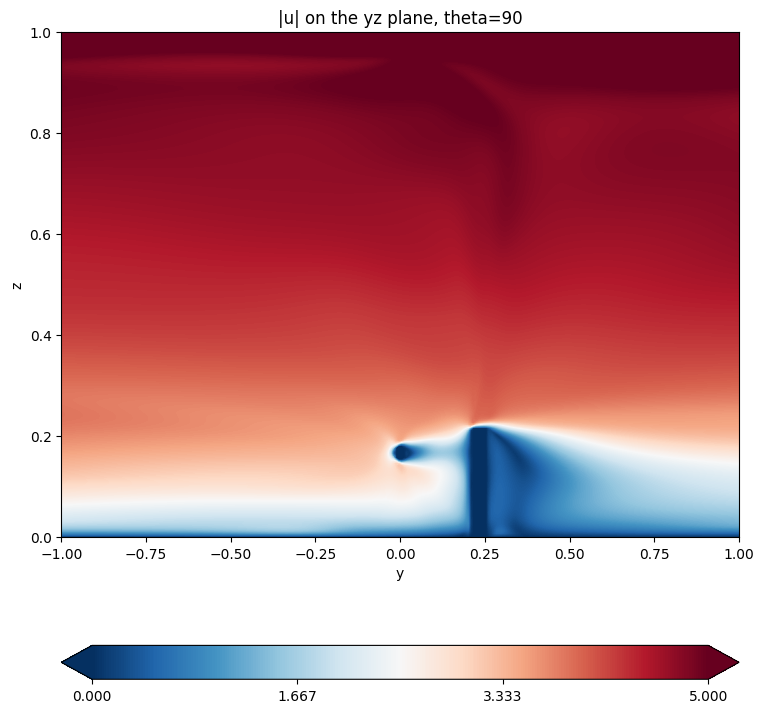

In [33]:
# test on yz plane
U = 4.043564066
resolution = 256
test_x = 500  # unit: meter

theta_range = np.arange(270, 90-15, -15)

for theta in theta_range:
    test_theta = np.deg2rad(theta)
    
    y = np.linspace(-1, 1, resolution)
    z = np.linspace(0, 1, resolution)
    y_grid, z_grid = np.meshgrid(y, z)
    y_test = np.reshape(y_grid, (-1, 1))
    z_test = np.reshape(z_grid, (-1, 1))
    x_test = np.ones_like(y_test) * (test_x - 500) / 300.0
    theta_test = np.ones_like(y_test) * test_theta
    
    x_test = tf.cast(x_test, dtype=data_type)
    y_test = tf.cast(y_test, dtype=data_type)
    z_test = tf.cast(z_test, dtype=data_type)
    theta_test = tf.cast(theta_test, dtype=data_type)
    
    loss_rans, loss_div = compute_PDE_residues(x_test, y_test, z_test, theta_test)
    
    loss_rans = tf.reshape(loss_rans, y_grid.shape)
    loss_div = tf.reshape(loss_div, y_grid.shape)
    
    # plot xy slice for rans
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(y_grid, z_grid, loss_rans, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,20,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,20,10, endpoint=True))
    plt.xlabel("y")
    plt.ylabel("z")
    ax.set_title(f'RANS residue on the yz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xy slice for div
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(y_grid, z_grid, loss_div, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(-10,10,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(-10,10,10, endpoint=True)) 
    plt.xlabel("y")
    plt.ylabel("z")
    ax.set_title(f'div residue on the yz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xy slice for u norm
    test_data = tf.concat([x_test, y_test, z_test, theta_test], axis=1)
    test_data = tf.cast(test_data, dtype=data_type)
    ux_pred = ux_model(test_data) * U
    uy_pred = uy_model(test_data) * U
    uz_pred = uz_model(test_data) * U
    u_norm = np.linalg.norm(tf.concat([ux_pred, uy_pred, uz_pred], axis=1), axis=1)
    u_norm = tf.reshape(u_norm, y_grid.shape)
    
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(y_grid, z_grid, u_norm, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,5,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,5,4, endpoint=True))
    
    # plot wind direction
#     wind_dir = np.array([np.cos(test_theta), np.sin(test_theta)])
#     ax.quiver(0, 0.7, wind_dir[0], wind_dir[1], color="k", scale=10, width=0.001, headwidth=4, headlength=4, headaxislength=3)
    
    plt.xlabel("y")
    plt.ylabel("z")
    ax.set_title(f'|u| on the yz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()

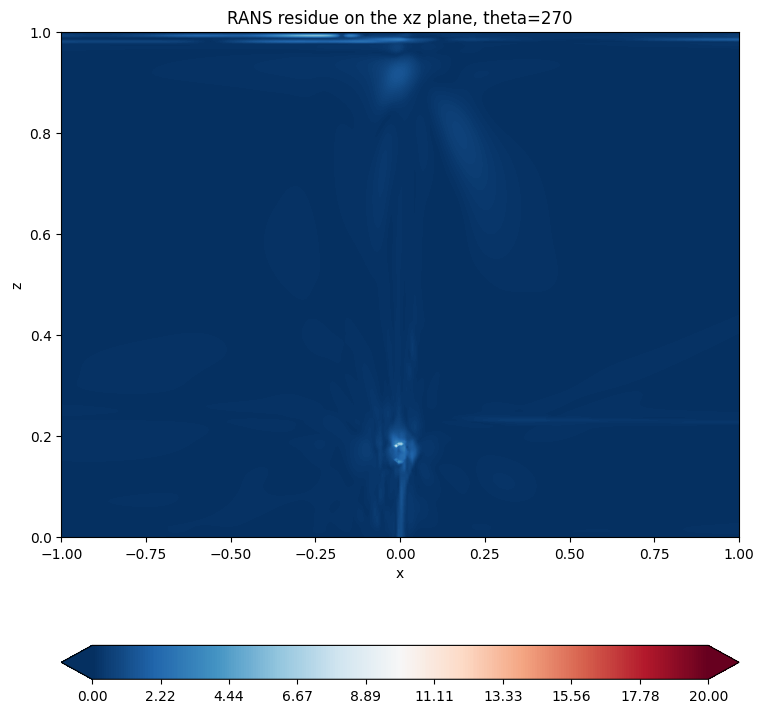

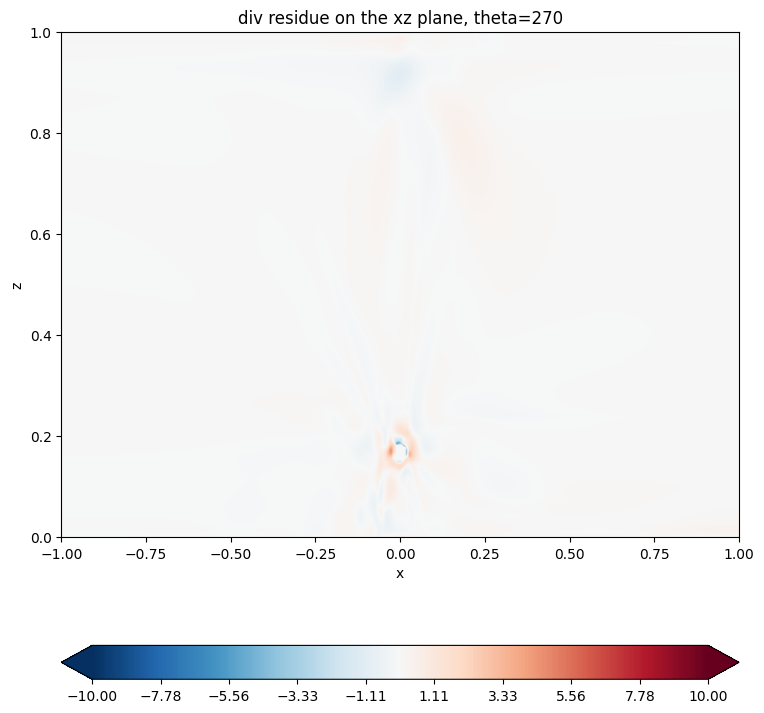

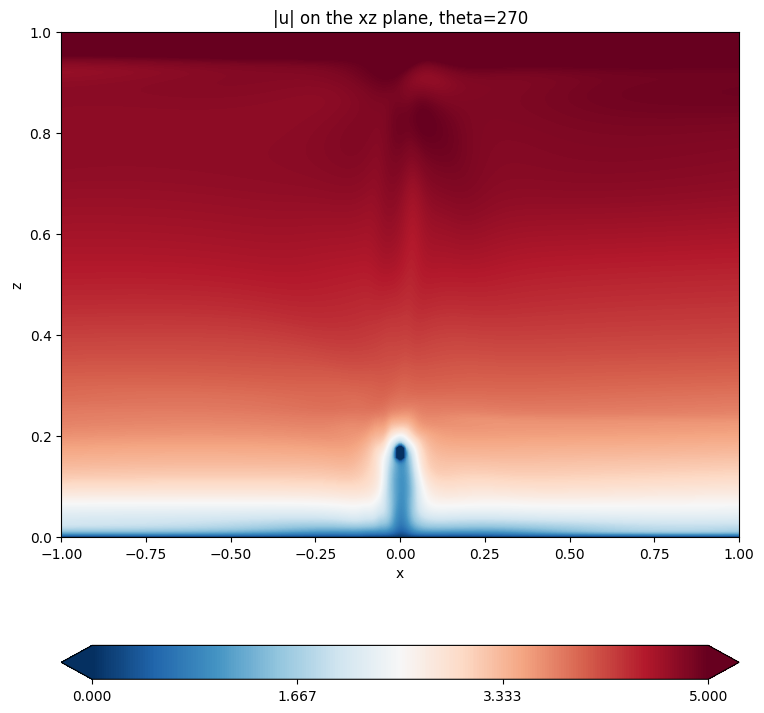

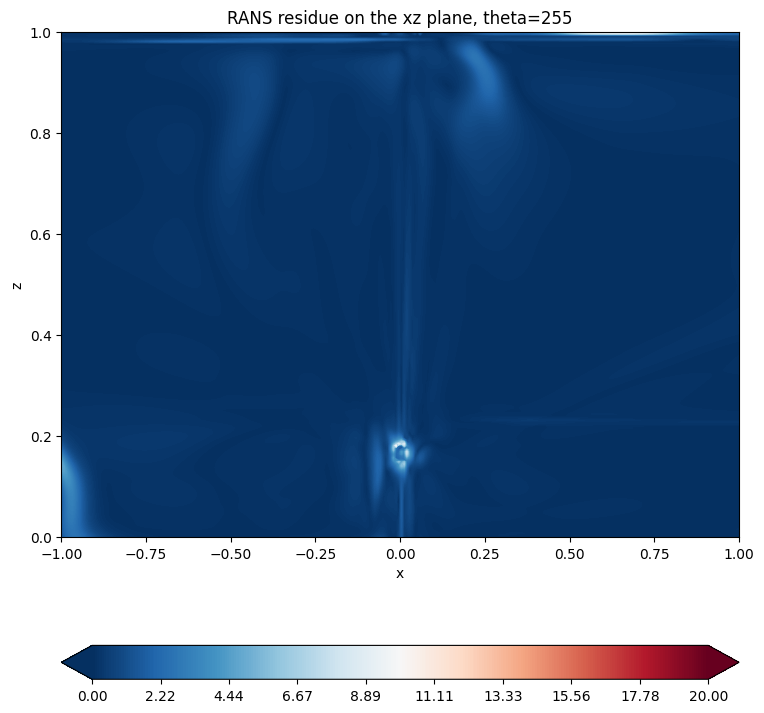

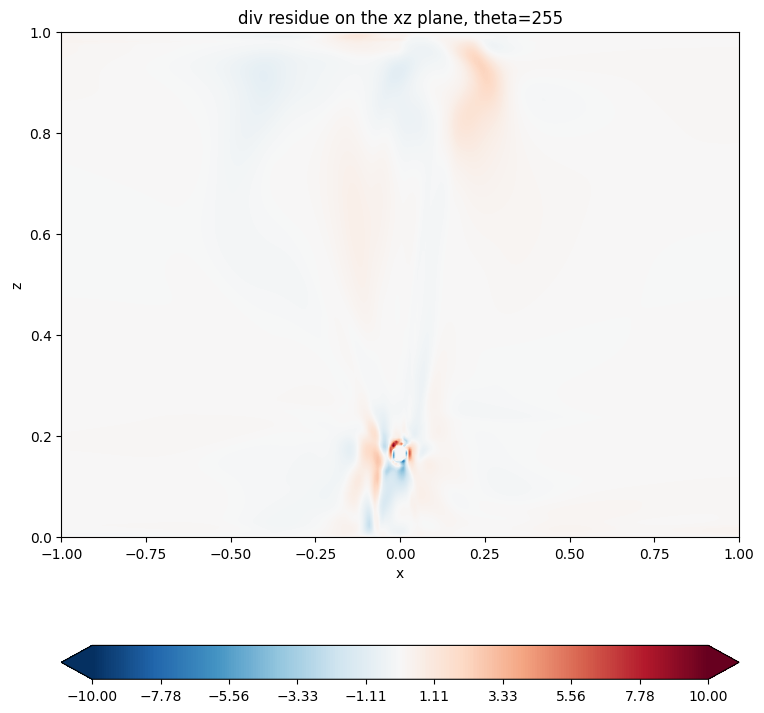

...

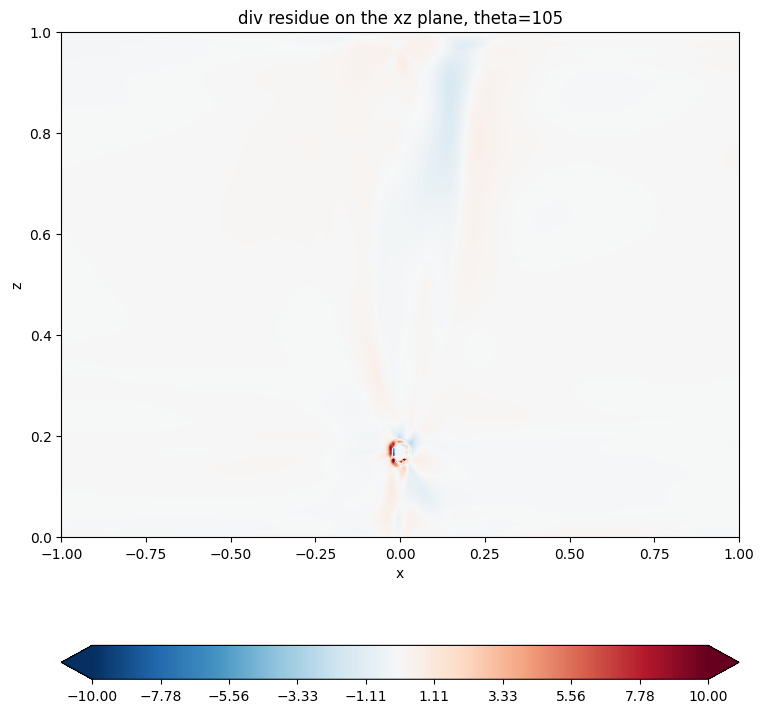

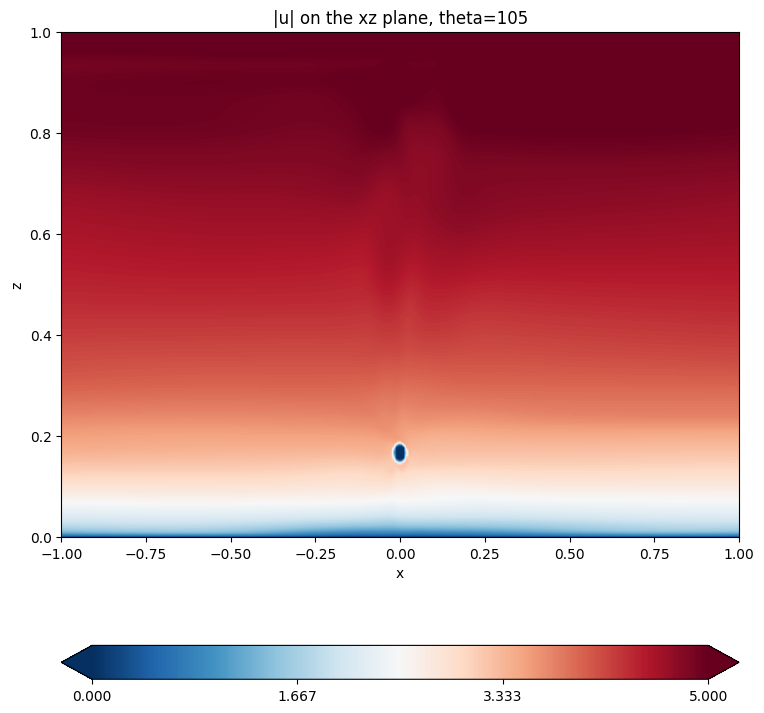

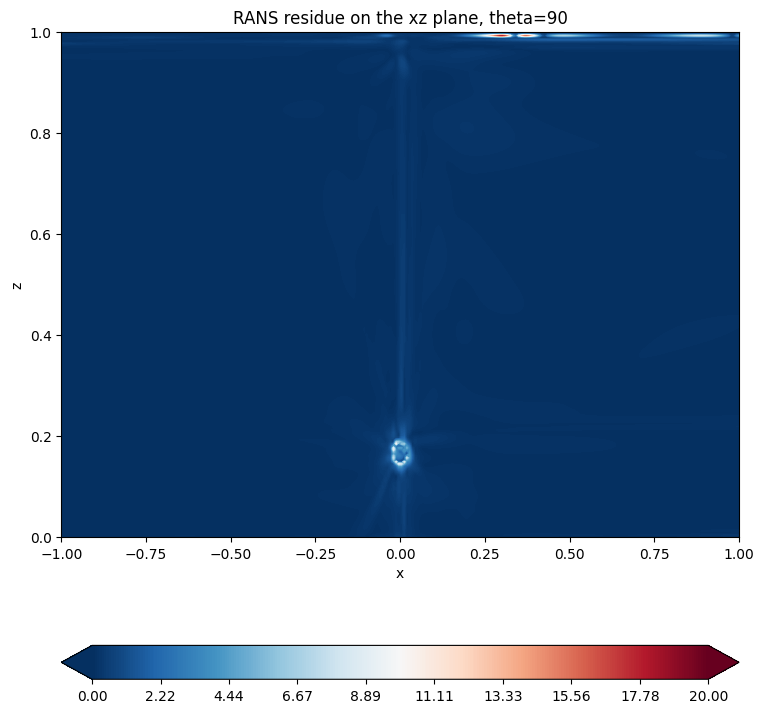

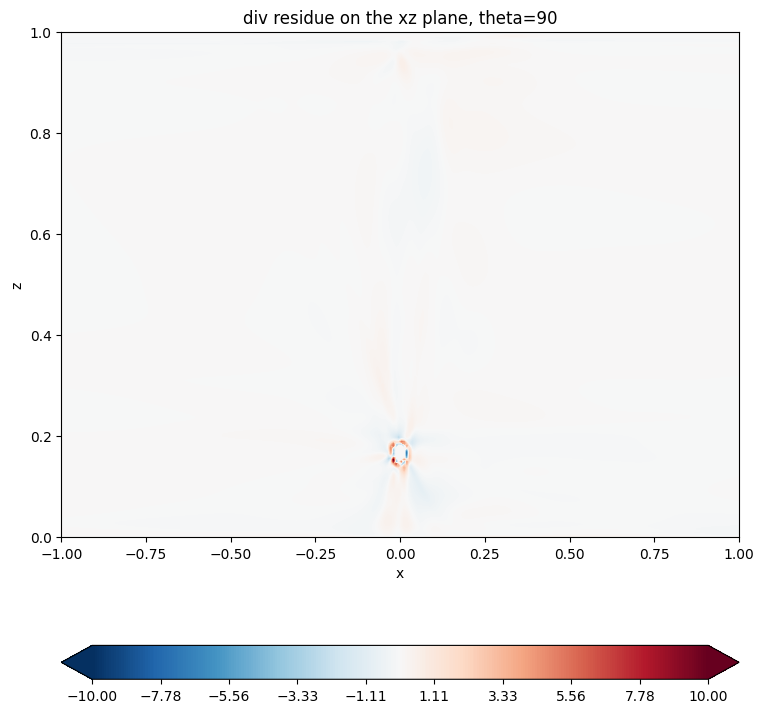

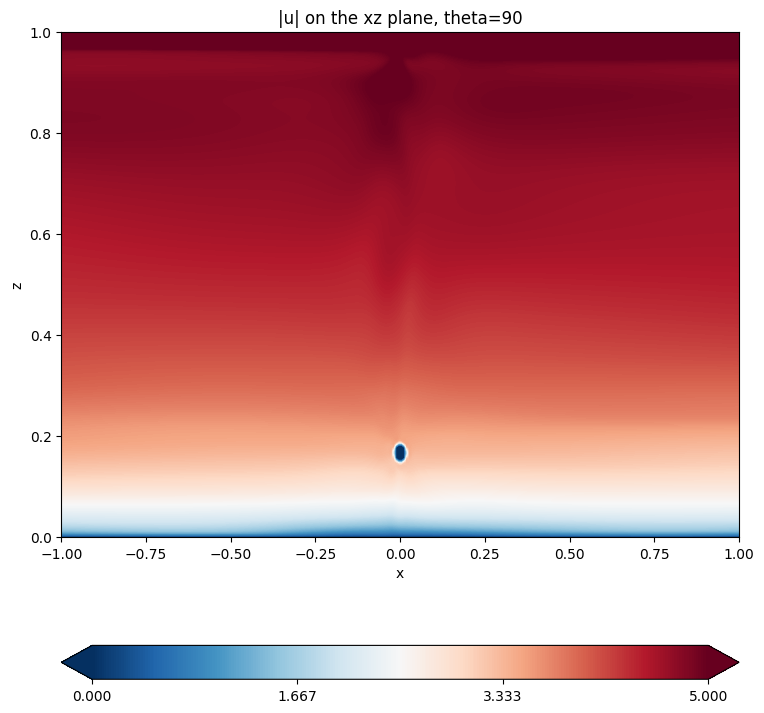

In [34]:
# test on xz plane
U = 4.043564066
resolution = 256
test_y = 500  # unit: meter

theta_range = np.arange(270, 90-15, -15)

for theta in theta_range:
    test_theta = np.deg2rad(theta)
    
    x = np.linspace(-1, 1, resolution)
    z = np.linspace(0, 1, resolution)
    x_grid, z_grid = np.meshgrid(x, z)
    x_test = np.reshape(x_grid, (-1, 1))
    z_test = np.reshape(z_grid, (-1, 1))
    y_test = np.ones_like(x_test) * (test_y - 500) / 300.0
    theta_test = np.ones_like(y_test) * test_theta
    
    x_test = tf.cast(x_test, dtype=data_type)
    y_test = tf.cast(y_test, dtype=data_type)
    z_test = tf.cast(z_test, dtype=data_type)
    theta_test = tf.cast(theta_test, dtype=data_type)
    
    loss_rans, loss_div = compute_PDE_residues(x_test, y_test, z_test, theta_test)
    
    loss_rans = tf.reshape(loss_rans, x_grid.shape)
    loss_div = tf.reshape(loss_div, x_grid.shape)
    
    # plot xz slice for rans
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, z_grid, loss_rans, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,20,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,20,10, endpoint=True))
    plt.xlabel("x")
    plt.ylabel("z")
    ax.set_title(f'RANS residue on the xz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xz slice for div
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, z_grid, loss_div, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(-10,10,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(-10,10,10, endpoint=True)) 
    plt.xlabel("x")
    plt.ylabel("z")
    ax.set_title(f'div residue on the xz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()
    
    # plot xz slice for u norm
    test_data = tf.concat([x_test, y_test, z_test, theta_test], axis=1)
    test_data = tf.cast(test_data, dtype=data_type)
    ux_pred = ux_model(test_data) * U
    uy_pred = uy_model(test_data) * U
    uz_pred = uz_model(test_data) * U
    u_norm = np.linalg.norm(tf.concat([ux_pred, uy_pred, uz_pred], axis=1), axis=1)
    u_norm = tf.reshape(u_norm, x_grid.shape)
    
    fig, ax = plt.subplots(figsize=[8,8])
    im = ax.contourf(x_grid, z_grid, u_norm, extend='both', cmap=plt.cm.RdBu_r, levels=np.linspace(0,5,1000))
    cbar_0 = fig.colorbar(im, ax=ax, orientation="horizontal", ticks=np.linspace(0,5,4, endpoint=True))
    
    # plot wind direction
#     wind_dir = np.array([np.cos(test_theta), np.sin(test_theta)])
#     ax.quiver(0, 0.7, wind_dir[0], wind_dir[1], color="k", scale=10, width=0.001, headwidth=4, headlength=4, headaxislength=3)
    
    plt.xlabel("x")
    plt.ylabel("z")
    ax.set_title(f'|u| on the xz plane, theta={theta}')
    plt.tight_layout(pad=2)
    plt.show()